In [1]:
import time

import pandas as pd
import numpy as np
from matplotlib import pyplot
import seaborn as sns
import imblearn
import xgboost
from dython.nominal import associations
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [6]:
train_df = pd.read_csv('./data/train (1).csv')
test_df = pd.read_csv('./data/test (1).csv') # validation set

In [721]:
import warnings
warnings.filterwarnings('ignore')

### Initial Data Exploration and cleaning

In [7]:
train_df.shape, test_df.shape

((69999, 172), (30000, 171))

In [8]:
train_df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [9]:
#train_df.info(verbose=1, show_counts=1)

#### fixing dtypes

In [10]:
dt_type_cols = train_df.select_dtypes('object').columns

In [11]:
dt_type_cols

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8'],
      dtype='object')

In [12]:
len(dt_type_cols)

9

In [13]:
train_df[dt_type_cols] = train_df[dt_type_cols].apply(pd.to_datetime, errors='coerce')
test_df[dt_type_cols] = test_df[dt_type_cols].apply(pd.to_datetime, errors='coerce')

#### dropping features with no information

In [14]:
t_loc = train_df.nunique().sort_values()<2 # features with only one unique value

In [15]:
t_loc.head(15)

std_ic_t2o_mou_6         True
circle_id                True
loc_og_t2o_mou           True
std_og_t2o_mou           True
loc_ic_t2o_mou           True
last_date_of_month_6     True
last_date_of_month_7     True
last_date_of_month_8     True
std_ic_t2o_mou_8         True
std_og_t2c_mou_8         True
std_og_t2c_mou_7         True
std_og_t2c_mou_6         True
std_ic_t2o_mou_7         True
night_pck_user_6        False
night_pck_user_7        False
dtype: bool

In [16]:
no_unique_cols = (t_loc.index[t_loc == True])

In [17]:
no_unique_cols

Index(['std_ic_t2o_mou_6', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'std_ic_t2o_mou_8', 'std_og_t2c_mou_8',
       'std_og_t2c_mou_7', 'std_og_t2c_mou_6', 'std_ic_t2o_mou_7'],
      dtype='object')

In [18]:
train_df[no_unique_cols].head()

,std_ic_t2o_mou_6,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,std_ic_t2o_mou_8,std_og_t2c_mou_8,std_og_t2c_mou_7,std_og_t2c_mou_6,std_ic_t2o_mou_7
0,0.0,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0
1,0.0,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0
2,0.0,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0
3,0.0,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0
4,0.0,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0


In [19]:
train_df.drop(no_unique_cols, axis=1, inplace= True) # dropping redundent features
test_df.drop(no_unique_cols, axis=1, inplace= True)

In [20]:
train_df.shape, test_df.shape

((69999, 159), (30000, 158))

#### exploring/understanding features

In [21]:
train_df.head(3)

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.0,0.0,0.0,0.0,0.0,0.0,2.23,0.00,0.28,5.29,16.04,2.33,0.0,0.0,0.0,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.0,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,2014-06-22,2014-07-10,2014-08-24,65,65,0,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.4,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,2014-06-12,2014-07-10,2014-08-26,0,0,0,NaT,2014-07-08,NaT,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,145.0,NaN,0.0,352.91,0.0,0.0,3.96,0.0,NaN,122.07,NaN,NaN,122.08,NaN,NaN,0.0,NaN,0,0,0,0,0,0,0,1,0,0,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.53,12.98,0.00,24.11,0.00,0.00,0.0,0.0,0.0,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.8

In [22]:
len([x for x in test_df.columns if x[-1].endswith(('6','7','8'))])

153

In [23]:
month_feats = [x for x in test_df.columns if x[-1].endswith(('6','7','8'))]

In [24]:
month_feats = [x[:-1] for x in month_feats]

In [25]:
month_feats = list(set(month_feats)); month_feats # unique features for different month

['ic_others_',
 'arpu_3g_',
 'sachet_2g_',
 'arpu_2g_',
 'isd_og_mou_',
 'max_rech_amt_',
 'total_ic_mou_',
 'count_rech_2g_',
 'onnet_mou_',
 'std_ic_t2m_mou_',
 'loc_og_t2m_mou_',
 'std_og_t2m_mou_',
 'std_ic_mou_',
 'count_rech_3g_',
 'std_og_t2f_mou_',
 'total_rech_data_',
 'fb_user_',
 'sachet_3g_',
 'loc_og_t2c_mou_',
 'std_og_t2t_mou_',
 'vol_3g_mb_',
 'vol_2g_mb_',
 'spl_ic_mou_',
 'std_og_mou_',
 'arpu_',
 'last_day_rch_amt_',
 'loc_og_mou_',
 'date_of_last_rech_',
 'monthly_3g_',
 'total_rech_amt_',
 'loc_og_t2f_mou_',
 'loc_ic_t2t_mou_',
 'offnet_mou_',
 'loc_ic_t2f_mou_',
 'loc_og_t2t_mou_',
 'spl_og_mou_',
 'total_rech_num_',
 'max_rech_data_',
 'monthly_2g_',
 'std_ic_t2f_mou_',
 'og_others_',
 'date_of_last_rech_data_',
 'roam_og_mou_',
 'std_ic_t2t_mou_',
 'night_pck_user_',
 'loc_ic_mou_',
 'roam_ic_mou_',
 'loc_ic_t2m_mou_',
 'isd_ic_mou_',
 'av_rech_amt_data_',
 'total_og_mou_']

In [26]:
len(month_feats)

51

In [27]:
# 51*3 = 153 (len of unique month wise features)

In [28]:
train_df.info(verbose=1, show_counts=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 159 columns):
 #    Column                    Non-Null Count  Dtype         
---   ------                    --------------  -----         
 0    id                        69999 non-null  int64         
 1    arpu_6                    69999 non-null  float64       
 2    arpu_7                    69999 non-null  float64       
 3    arpu_8                    69999 non-null  float64       
 4    onnet_mou_6               67231 non-null  float64       
 5    onnet_mou_7               67312 non-null  float64       
 6    onnet_mou_8               66296 non-null  float64       
 7    offnet_mou_6              67231 non-null  float64       
 8    offnet_mou_7              67312 non-null  float64       
 9    offnet_mou_8              66296 non-null  float64       
 10   roam_ic_mou_6             67231 non-null  float64       
 11   roam_ic_mou_7             67312 non-null  float64       
 12   ro

In [29]:
train_df.dtypes.unique()

array([dtype('int64'), dtype('float64'), dtype('<M8[ns]')], dtype=object)

In [30]:
train_df.describe()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69

In [31]:
train_df.isna().sum().sum()

1813532

#### Exporing and fixing misiing values 

In [32]:
(train_df.isna().sum()/(train_df.shape[0])*100).sort_values(ascending=False)

arpu_3g_6                   74.902499
night_pck_user_6            74.902499
total_rech_data_6           74.902499
max_rech_data_6             74.902499
date_of_last_rech_data_6    74.902499
count_rech_2g_6             74.902499
av_rech_amt_data_6          74.902499
fb_user_6                   74.902499
count_rech_3g_6             74.902499
arpu_2g_6                   74.902499
total_rech_data_7           74.478207
fb_user_7                   74.478207
count_rech_2g_7             74.478207
max_rech_data_7             74.478207
count_rech_3g_7             74.478207
av_rech_amt_data_7          74.478207
arpu_2g_7                   74.478207
night_pck_user_7            74.478207
date_of_last_rech_data_7    74.478207
arpu_3g_7                   74.478207
total_rech_data_8           73.689624
arpu_2g_8                   73.689624
max_rech_data_8             73.689624
count_rech_2g_8             73.689624
count_rech_3g_8             73.689624
av_rech_amt_data_8          73.689624
night_pck_us

In [33]:
missing_vals_cols = ((train_df.isna().sum()/(train_df.shape[0])*100).sort_values(ascending=False)>0).index[((train_df.isna().sum()/(train_df.shape[0])*100).sort_values(ascending=False)>0)==True]


In [34]:
len(missing_vals_cols)

114

In [35]:
train_df[missing_vals_cols].head()

,arpu_3g_6,night_pck_user_6,total_rech_data_6,max_rech_data_6,date_of_last_rech_data_6,count_rech_2g_6,av_rech_amt_data_6,fb_user_6,count_rech_3g_6,arpu_2g_6,total_rech_data_7,fb_user_7,count_rech_2g_7,max_rech_data_7,count_rech_3g_7,av_rech_amt_data_7,arpu_2g_7,night_pck_user_7,date_of_last_rech_data_7,arpu_3g_7,total_rech_data_8,arpu_2g_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,night_pck_user_8,fb_user_8,arpu_3g_8,date_of_last_rech_data_8,og_others_8,loc_ic_mou_8,spl_ic_mou_8,spl_og_mou_8,std_ic_t2t_mou_8,isd_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,offnet_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2m_mou_8,roam_ic_mou_8,roam_og_mou_8,isd_ic_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,std_ic_mou_8,onnet_mou_8,loc_og_t2f_mou_8,loc_ic_t2f_mou_8,loc_og_t2c_mou_8,std_ic_t2f_mou_8,loc_og_mou_8,ic_others_8,std_og_t2t_mou_8,std_ic_t2t_mou_6,loc_ic_mou_6,std_ic_t2f_mou_6,spl_ic_mou_6,ic_others_6,std_ic_t2m_mou_6,std_ic_mou_6,isd_og_mou_6,loc_ic_t2f_mou_6,loc_ic_t2m_mou_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,spl_og_mou_6,og_others_6,loc_ic_t2t_mou_6,isd_ic_mou_6,ic_others_7,isd_ic_mou_7,loc_ic_mou_7,spl_ic_mou_7,loc_og_mou_7,og_others_7,spl_og_mou_7,isd_og_mou_7,std_og_mou_7,std_og_t2f_mou_7,std_og_t2m_mou_7,std_og_t2t_mou_7,loc_og_t2c_mou_7,loc_ic_t2f_mou_7,loc_og_t2f_mou_7,loc_og_t2m_mou_7,loc_og_t2t_mou_7,roam_og_mou_7,roam_ic_mou_7,offnet_mou_7,onnet_mou_7,loc_ic_t2m_mou_7,loc_ic_t2t_mou_7,std_ic_t2t_mou_7,std_ic_mou_7,std_ic_t2f_mou_7,std_ic_t2m_mou_7,date_of_last_rech_8,date_of_last_rech_7,date_of_last_rech_6
0,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,0.0,24.71,0.66,0.00,0.21,0.0,7.79,16.91,1.01,2.33,0.0,0.0,14.96,0.0,0.00,0.0,0.28,2.33,15.18,1.29,0.00,0.00,0.00,0.0,2.61,0.00,1.01,0.00,3.26,0.0,0.0,1.11,7.46,7.46,0.0,0.00,0.83,48.58,32.24,0.00,0.00,2.23,5.29,0.00,0.00,7.53,46.34,18.75,0.00,65.09,8.20,0.38,2.43,0.0,0.69,0.0,24.76,0.0,16.04,0.0,0.63,0.0,204.99,0.0,80.61,124.38,0.00,0.00,0.00,16.04,0.00,0.0,0.0,96.68,124.38,21.08,3.68,7.61,27.58,0.0,19.96,2014-08-24,2014-07-10,2014-06-22
1,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,145.0,1.0,145.0,122.08,0.0,2014-07-08,122.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,0.0,25.03,0.01,31.66,0.00,0.0,10.53,11.09,0.00,30.89,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,3.40,29.79,0.0,0.00,0.00,0.00,0.00,3.44,0.0,0.0,0.00,0.00,0.00,0.0,0.35,1.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.68,0.0,0.00,0.0,39.44,0.0,0.00,0.0,30.73,0.0,0.00,0.0,0.00,0.00,22.01,1.66,0.00,0.00,0.00,0.0,0.0,25.99,0.00,18.68,19.09,0.00,0.00,0.0,0.00,2014-08-26,2014-07-10,2014-06-12
2,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,0.0,30.01,0.00,0.00,0.00,0.0,6.49,23.51,0.00,0.00,0.0,0.0,6.38,0.0,0.00,0.0,0.00,0.00,6.38,0.00,0.00,0.00,0.00,0.0,0.00,0.25,0.00,11.69,94.38,0.0,0.0,0.00,18.21,29.91,0.0,0.00,89.86,0.53,53.99,0.00,0.00,0.53,24.11,0.00,2.14,24.64,0.00,28.94,0.00,28.94,2.89,0.00,4.51,0.0,0.00,0.0,31.34,0.0,12.98,0.0,1.38,0.0,84.99,0.0,82.05,2.94,0.00,0.00,0.00,0.00,12.98,0.0,0.0,82.05,15.93,25.18,6.16,0.00,2.48,0.0,2.48,2014-08-24,2014-07-22,2014-06-11
3,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,0.0,81.03,0.00,25.61,0.00,0.0,23.88,57.14,4.60,50.23,4.6,0.0,2.81,0.0,1.63,0.0,0.00,23.63,2.81,0.00,0.00,0.00,8.03,0.0,23.63,0.00,0.00,0.00,86.21,0.0,0.0,0.00,8.89,8.89,0.0,7.23,53.99,7.26,68.76,0.00,0.00,6.99,37.91,0.00,0.00,44.91,0.26,15.33,0.56,16.16,14.95,0.00,24.98,0.0,0.00,0.0,49.89,0.0,48.84,0.0,9.13,0.0,37.99,0.0,25.93,12.06,0.00,0.81,0.00,44.89,3.94,0.0,0.0,78.48,16.01,44.23,4.84,0.00,0.28,0.0,0.28,2014-08-25,2014-07-21,2014-06-15
4

#### identifying categorical features

In [36]:
train_df[missing_vals_cols].nunique().sort_values()

night_pck_user_6                2
night_pck_user_8                2
fb_user_8                       2
night_pck_user_7                2
fb_user_7                       2
fb_user_6                       2
count_rech_3g_6                23
count_rech_3g_7                27
count_rech_3g_8                29
date_of_last_rech_6            30
count_rech_2g_6                30
date_of_last_rech_data_6       30
date_of_last_rech_data_8       31
date_of_last_rech_8            31
date_of_last_rech_7            31
date_of_last_rech_data_7       31
count_rech_2g_8                33
count_rech_2g_7                33
total_rech_data_6              36
total_rech_data_7              41
total_rech_data_8              44
max_rech_data_7                45
max_rech_data_6                47
max_rech_data_8                49
spl_ic_mou_6                   78
spl_ic_mou_8                   95
spl_ic_mou_7                  103
og_others_7                   148
og_others_8                   179
av_rech_amt_da

In [37]:
misiing_cat_features = (train_df[missing_vals_cols].nunique().sort_values()<=3).index[:6]

In [38]:
train_df[misiing_cat_features].apply(pd.Series.value_counts)

,night_pck_user_6,night_pck_user_8,fb_user_8,night_pck_user_7,fb_user_7,fb_user_6
0.0,17124,18030,2020,17435,1616,1470
1.0,444,387,16397,430,16249,16098


In [39]:
train_df[misiing_cat_features].isna().sum()

night_pck_user_6    52431
night_pck_user_8    51582
fb_user_8           51582
night_pck_user_7    52134
fb_user_7           52134
fb_user_6           52431
dtype: int64

#####  we will consider nan values as 0 for ^ categorical features, considering the users never subsribed to the services

In [40]:
train_df[misiing_cat_features] = train_df[misiing_cat_features].fillna(0,)

In [41]:
test_df[misiing_cat_features] = test_df[misiing_cat_features].fillna(0,)

In [42]:
train_df[misiing_cat_features].isna().sum()

night_pck_user_6    0
night_pck_user_8    0
fb_user_8           0
night_pck_user_7    0
fb_user_7           0
fb_user_6           0
dtype: int64

In [43]:
test_df[misiing_cat_features].isna().sum()

night_pck_user_6    0
night_pck_user_8    0
fb_user_8           0
night_pck_user_7    0
fb_user_7           0
fb_user_6           0
dtype: int64

In [44]:
missing_vals_cols = [x for x in missing_vals_cols if x not in misiing_cat_features] ; len(missing_vals_cols)

108

In [45]:
train_df[missing_vals_cols].describe()

,arpu_3g_6,total_rech_data_6,max_rech_data_6,count_rech_2g_6,av_rech_amt_data_6,count_rech_3g_6,arpu_2g_6,total_rech_data_7,count_rech_2g_7,max_rech_data_7,count_rech_3g_7,av_rech_amt_data_7,arpu_2g_7,arpu_3g_7,total_rech_data_8,arpu_2g_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,arpu_3g_8,og_others_8,loc_ic_mou_8,spl_ic_mou_8,spl_og_mou_8,std_ic_t2t_mou_8,isd_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,offnet_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2m_mou_8,roam_ic_mou_8,roam_og_mou_8,isd_ic_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,std_ic_mou_8,onnet_mou_8,loc_og_t2f_mou_8,loc_ic_t2f_mou_8,loc_og_t2c_mou_8,std_ic_t2f_mou_8,loc_og_mou_8,ic_others_8,std_og_t2t_mou_8,std_ic_t2t_mou_6,loc_ic_mou_6,std_ic_t2f_mou_6,spl_ic_mou_6,ic_others_6,std_ic_t2m_mou_6,std_ic_mou_6,isd_og_mou_6,loc_ic_t2f_mou_6,loc_ic_t2m_mou_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,spl_og_mou_6,og_others_6,loc_ic_t2t_mou_6,isd_ic_mou_6,ic_others_7,isd_ic_mou_7,loc_ic_mou_7,spl_ic_mou_7,loc_og_mou_7,og_others_7,spl_og_mou_7,isd_og_mou_7,std_og_mou_7,std_og_t2f_mou_7,std_og_t2m_mou_7,std_og_t2t_mou_7,loc_og_t2c_mou_7,loc_ic_t2f_mou_7,loc_og_t2f_mou_7,loc_og_t2m_mou_7,loc_og_t2t_mou_7,roam_og_mou_7,roam_ic_mou_7,offnet_mou_7,onnet_mou_7,loc_ic_t2m_mou_7,loc_ic_t2t_mou_7,std_ic_t2t_mou_7,std_ic_mou_7,std_ic_t2f_mou_7,std_ic_t2m_mou_7
count,17568.000000,17568.000000,17568.000000,17568.000000,17568.000000,17568.000000,17568.000000,17865.000000,17865.000000,17865.000000,17865.000000,17865.000000,17865.000000,17865.000000,18417.000000,18417.000000,18417.000000,18417.000000,18417.000000,18417.000000,18417.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,66296.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67231.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000,67312.000000
mean,90.069931,2.467612,126.500000,1.865323,192.831096,0.602288,86.863900,2.679989,2.056311,126.402071,0.623678,201.455940,85.846074,89.115767,2.652441,86.348404,125.374925,2.016018,0.636423,196.815792,90.618564,0.033059,167.136761,0.040392,5.045027,9.910217,0.841648,47.256388,108.154731,175.118852,196.543577,90.586999,1.057739,21.089042,7.004892,9.771783,8.348424,45.686109,91.121447,33.077030,132.978257,3.661652,11.716763,1.420840,2.075179,140.476486,0.963214,83.471486,9.476958,167.255126,2.146273,0.061932,0.854063,20.734858,32.360632,0.845763,12.050672,107.152439,133.153275,198.874771,9.765435,14.186457,46.904854,93.238231,3.743179,1.126025,143.893585,80.619382,88.152110,1.126377,169.900601,3.958619,0.462581,48.043255,7.394167,1.019680,8.171162,166.945103,0.033371,140.750120,0.024425,4.976783,0.811100,176.401217,1.084062,91.538615,83.775851,1.361052,12.563665,3.777031,90.799240,46.166503,9.842191,7.014568,197.153383,133.894438,106.489856,47.882736,9.873468,33.760809,2.199395,21.685359
std,193.600413,2.794610,109.352573,2.566377,190.623115,1.279297,171.321203,3.073472,2.799916,109.459266,1.401230,198.346141,178.067280,195.82699

#### For numeric features with missing values, we can assume that users did not use/recharge for this particular feature in the given month, and hence can be represented as zero

In [46]:
missing_num_cols = train_df[missing_vals_cols].select_dtypes([float, int]).columns

In [47]:
train_df[missing_num_cols].isna().sum().sum(), test_df[missing_num_cols].isna().sum().sum(), 

(1340295, 575941)

In [48]:
train_df[missing_num_cols] = train_df[missing_num_cols].fillna(0)
test_df[missing_num_cols] = test_df[missing_num_cols].fillna(0)

In [49]:
train_df[missing_num_cols].isna().sum().sum(), test_df[missing_num_cols].isna().sum().sum(), 

(0, 0)

In [50]:
train_df.isna().sum().sort_values(ascending=0).head(7)

date_of_last_rech_data_6    52431
date_of_last_rech_data_7    52134
date_of_last_rech_data_8    51582
date_of_last_rech_8          2461
date_of_last_rech_7          1234
date_of_last_rech_6          1101
total_rech_data_6               0
dtype: int64

In [51]:
missing_date_cols = train_df.isna().sum().sort_values(ascending=0).index[:6]; missing_date_cols

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_8',
       'date_of_last_rech_7', 'date_of_last_rech_6'],
      dtype='object')

### Feature Engineering (part 1)
- We will capture week of month information from ^ date-type featues and mark null values as zero, assuming they never recharged


In [52]:
train_df[missing_date_cols] = train_df[missing_date_cols].apply(lambda d: (d.dt.day-1) // 7 + 1)
test_df[missing_date_cols] = test_df[missing_date_cols].apply(lambda d: (d.dt.day-1) // 7 + 1)

In [53]:
train_df[missing_date_cols] = train_df[missing_date_cols].fillna(0)
test_df[missing_date_cols] = test_df[missing_date_cols].fillna(0)

In [54]:
[x.replace('date_', 'week_no_') for x in missing_date_cols]

['week_no_of_last_rech_data_6',
 'week_no_of_last_rech_data_7',
 'week_no_of_last_rech_data_8',
 'week_no_of_last_rech_8',
 'week_no_of_last_rech_7',
 'week_no_of_last_rech_6']

In [55]:
dict(zip(missing_date_cols, [x.replace('date_', 'week_no_') for x in missing_date_cols]))

{'date_of_last_rech_data_6': 'week_no_of_last_rech_data_6',
 'date_of_last_rech_data_7': 'week_no_of_last_rech_data_7',
 'date_of_last_rech_data_8': 'week_no_of_last_rech_data_8',
 'date_of_last_rech_8': 'week_no_of_last_rech_8',
 'date_of_last_rech_7': 'week_no_of_last_rech_7',
 'date_of_last_rech_6': 'week_no_of_last_rech_6'}

In [56]:
train_df.rename(dict(zip(missing_date_cols, [x.replace('date_', 'week_no_') for x in missing_date_cols])), inplace=True, axis=1)
test_df.rename(dict(zip(missing_date_cols, [x.replace('date_', 'week_no_') for x in missing_date_cols])), inplace=True, axis = 1)


#####  we will rename `vbc_3g` feature

In [57]:
train_df.rename({'aug_vbc_3g': 'vbc_3g_8', 'jul_vbc_3g' : 'vbc_3g_7', 'jun_vbc_3g': 'vbc_3g_6'}, axis = 1, inplace=True)
test_df.rename({'aug_vbc_3g': 'vbc_3g_8', 'jul_vbc_3g' : 'vbc_3g_7', 'jun_vbc_3g': 'vbc_3g_6'}, axis = 1, inplace=True)

In [58]:
month_feats.append('vbc_3g_')

In [59]:
train_df.isna().sum().sort_values(ascending=0).head(6)

id                        0
total_rech_data_6         0
week_no_of_last_rech_8    0
last_day_rch_amt_6        0
last_day_rch_amt_7        0
last_day_rch_amt_8        0
dtype: int64

#####  We'll also drop identifier information

In [60]:
train_df.drop('id',axis = 1, inplace=True)
test_df.drop('id',axis = 1, inplace=True)


####  Up till now, we have imputed all missing values, dropped features with no information, and derieved new features from  date-type features

In [61]:
train_df.shape

(69999, 158)

In [62]:
test_df.shape

(30000, 157)

## EDA

##### But First, Seperating numeric features from categorical

In [63]:
cat_feat = train_df.nunique().sort_values(ascending=1).index[:15]

In [64]:
num_feat = test_df.columns.difference(cat_feat)

In [65]:
len(num_feat)

143

In [66]:
palette = iter(sns.color_palette("Set2", 200))

In [67]:
enumerate(num_feat[:37])

#### visualizing churn ratio

<AxesSubplot:>

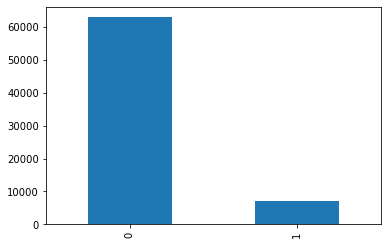

In [69]:
train_df.churn_probability.value_counts().plot(kind = 'bar')

<AxesSubplot:>

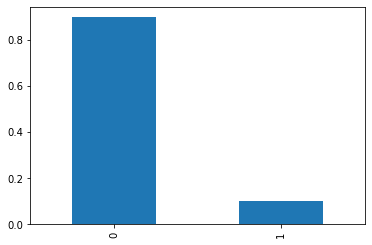

In [722]:
train_df.churn_probability.value_counts(1).plot(kind = 'bar')

#### We observe that churn ratio is imbalanced (~ 1:9)

/var/folders/z0/wbc1b27j3r5102_79kyb6hyr0000gn/T/ipykernel_61756/2714312897.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  pyplot.figure(figsize=(15,15))


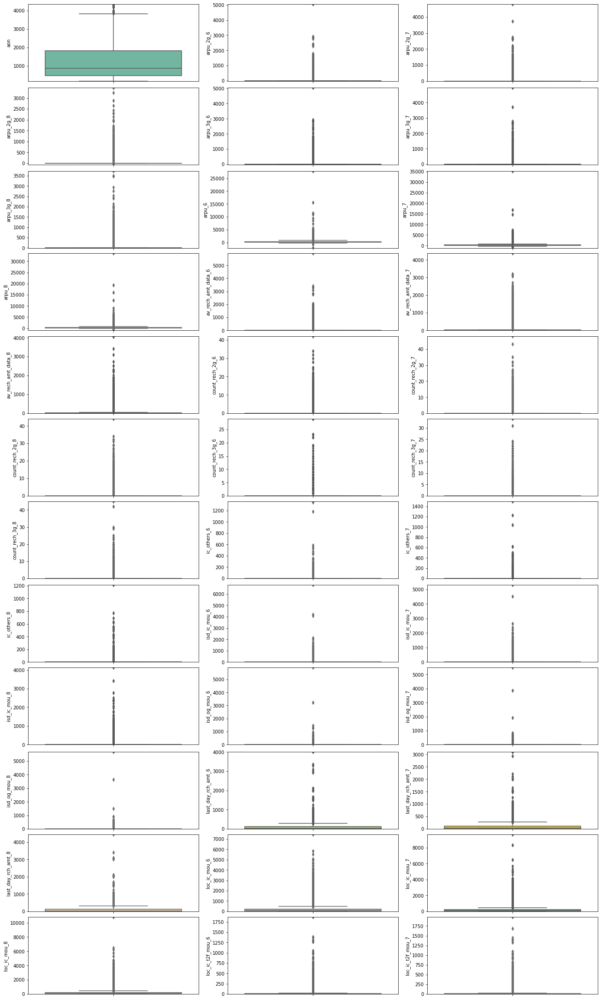

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [68]:
fig, axes = pyplot.subplots(12, 3, constrained_layout=True, figsize=(18,30))
for i, col in enumerate(num_feat[:36]):
    pyplot.figure(figsize=(15,15))
    ax = sns.boxplot(y=train_df[col], ax=axes.flatten()[i], color=next(palette),)
    ax.set_ylim(train_df[col].min(), train_df[col].max())
    ax.set_ylabel(col)
# plt.subplots_adjust(left=0.1,
#                     bottom=0.1, 
#                     right=1.5, 
#                     top=0.9, 
#                     wspace=0.4, 

#                     hspace=0.4)
# fig.delaxes(axes[11][2])
# fig.delaxes(axes[11][1])
pyplot.show()

In [70]:
month_feats[10]

'total_rech_amt_'

In [237]:
def create_pairplot(feat, ):
    feat_list = [f'{feat}{i}' for i in [6,7,8]]
    feat_list.append('churn_probability')
    rp = sns.pairplot(data = train_df[feat_list], hue='churn_probability', diag_kind='auto',)
    rp.fig.subplots_adjust(top=0.9)
    rp.fig.suptitle(feat[:-1])

#### creating pairplots to visualize numeric features about different months

working on -- total_rech_num_
working on -- total_rech_data_
working on -- count_rech_2g_
working on -- max_rech_amt_
working on -- onnet_mou_


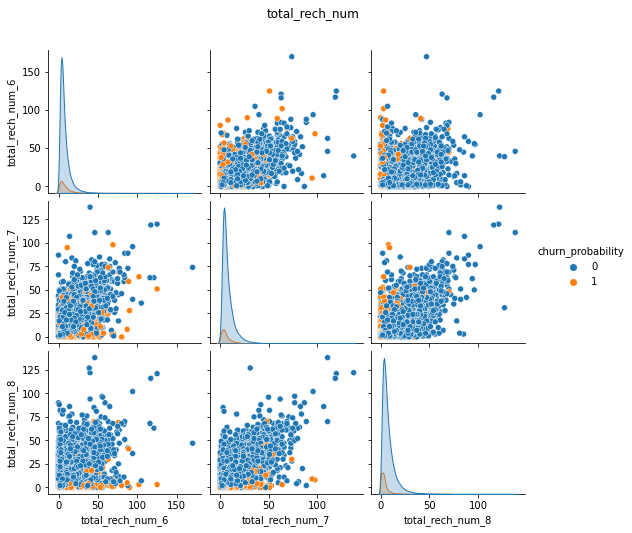

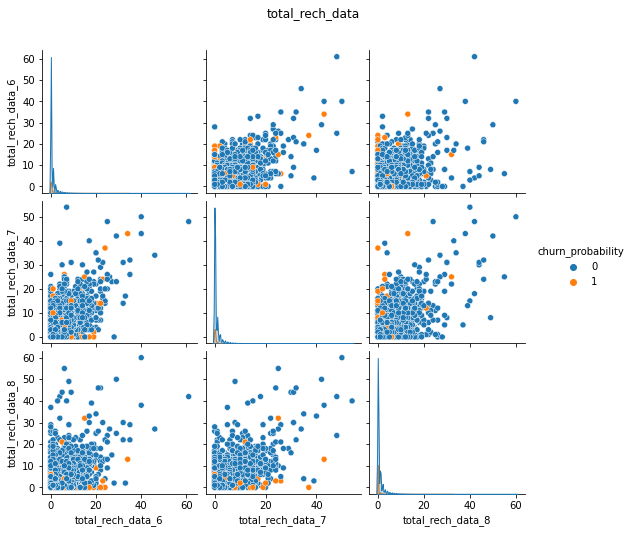

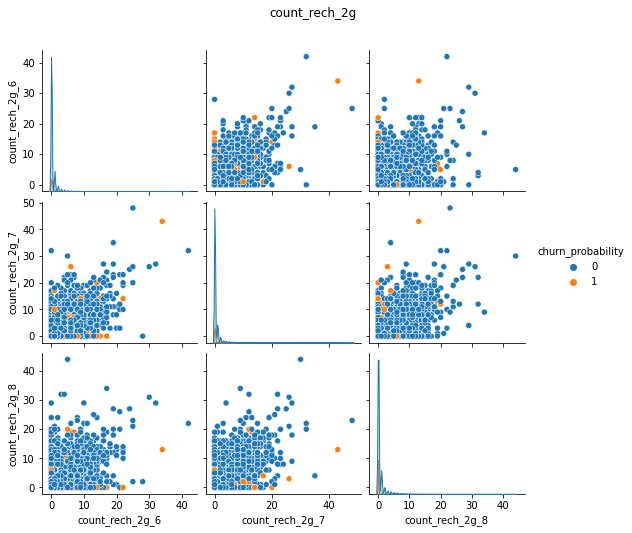

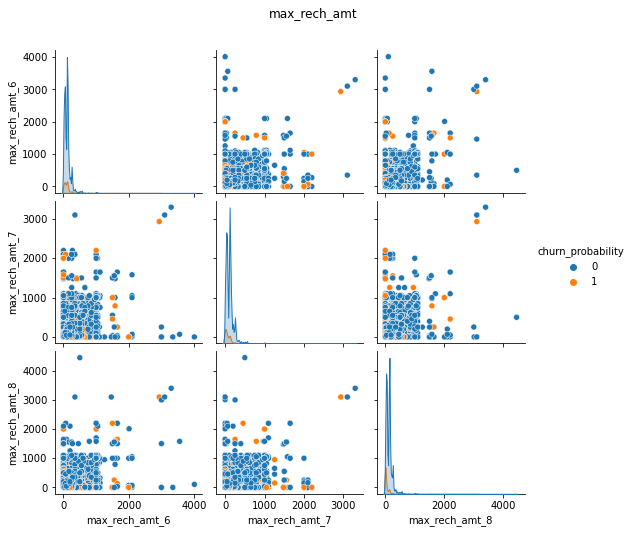

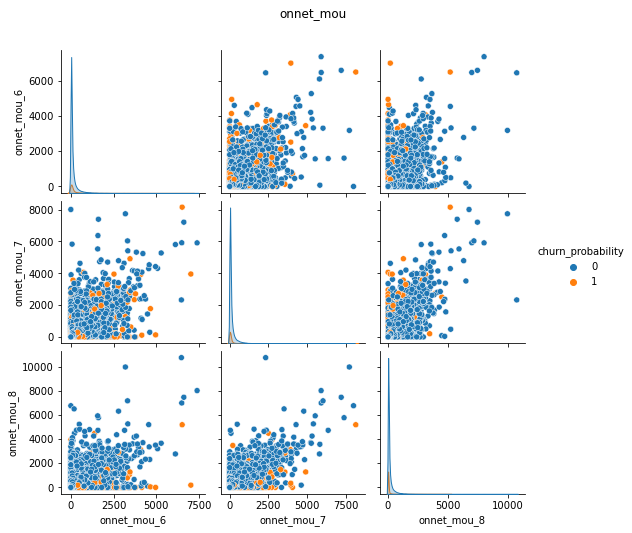

In [240]:
for feat in month_feats[0:5]:
    print(f'working on -- {feat}')
    create_pairplot(feat)

working on -- vol_2g_mb_
working on -- monthly_3g_
working on -- offnet_mou_
working on -- loc_og_mou_
working on -- std_og_t2m_mou_
working on -- monthly_2g_
working on -- roam_ic_mou_
working on -- last_day_rch_amt_
working on -- count_rech_3g_
working on -- loc_ic_t2m_mou_


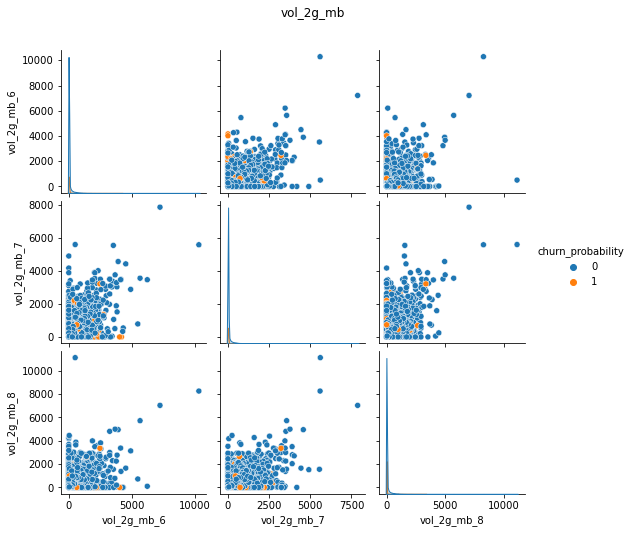

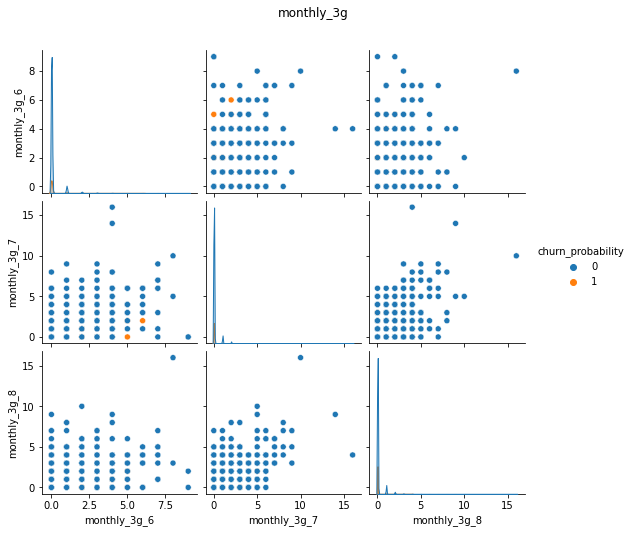

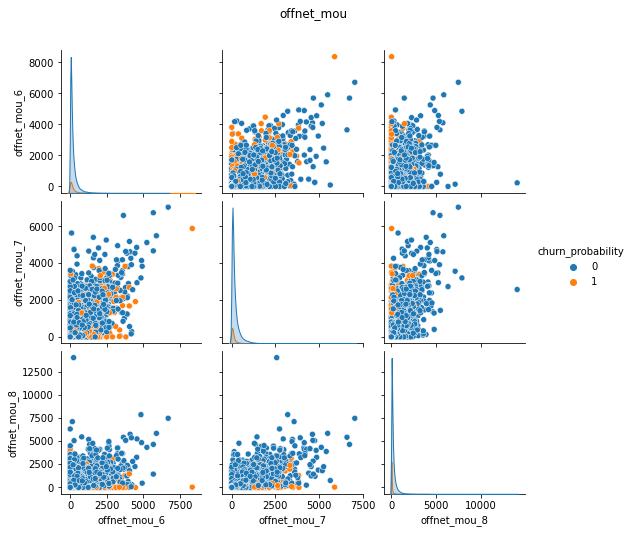

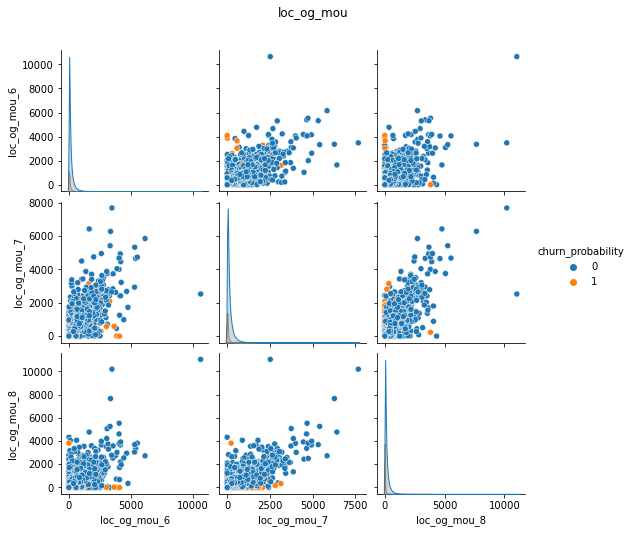

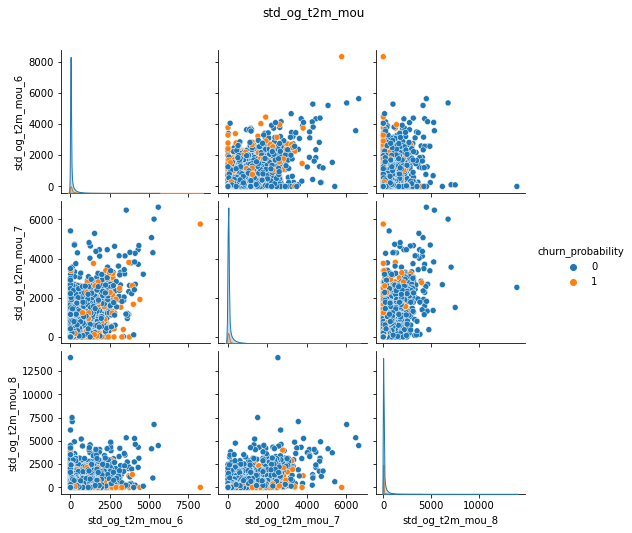

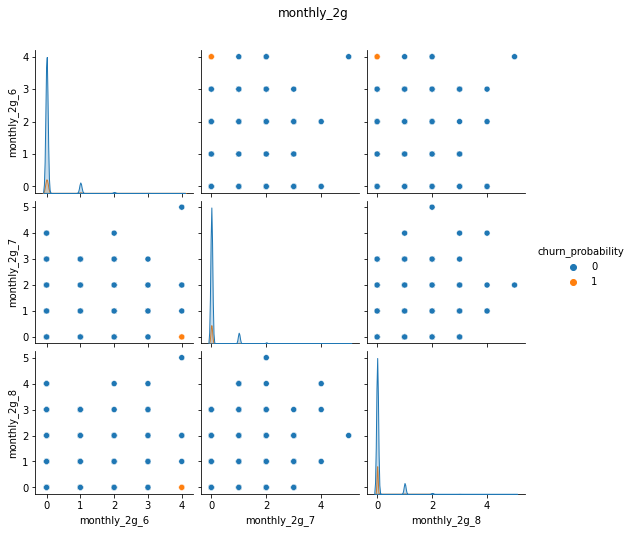

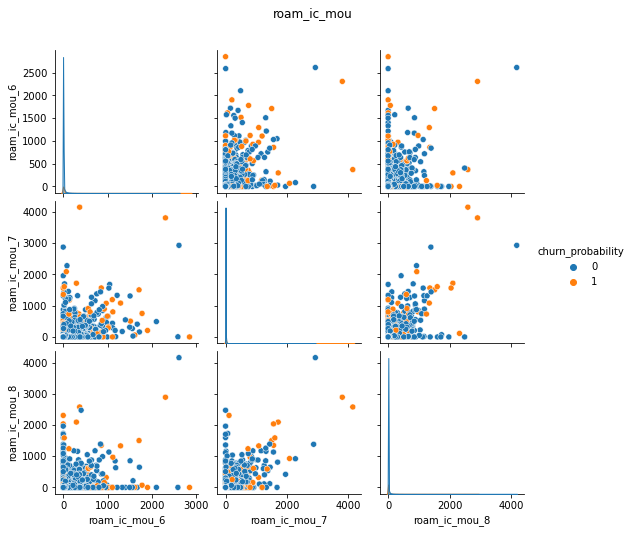

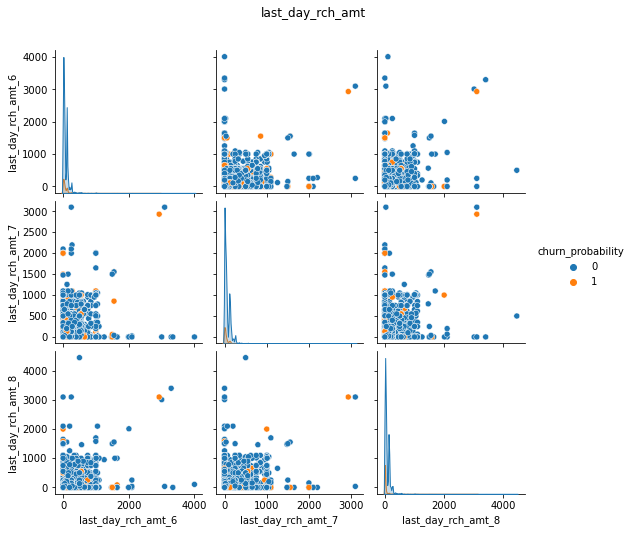

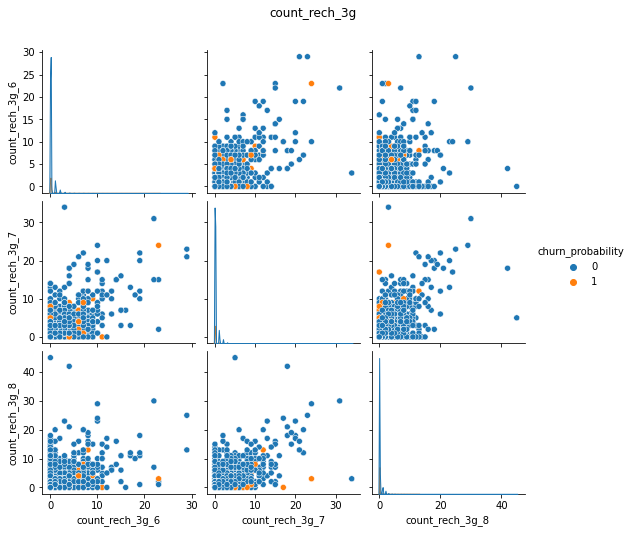

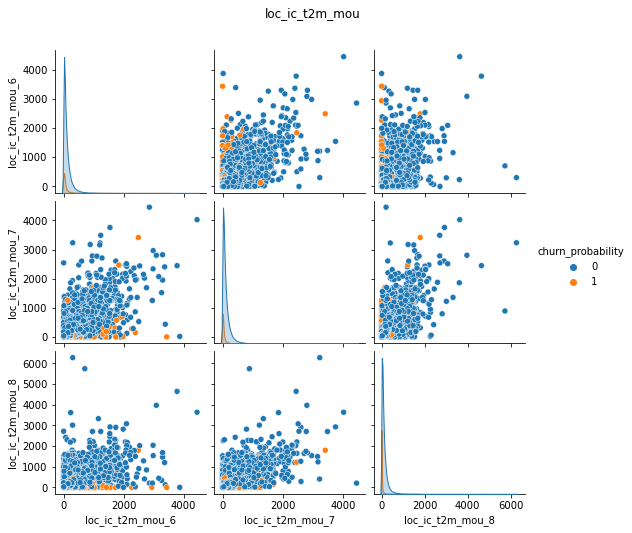

In [242]:
for feat in month_feats[5:15]:
    print(f'working on -- {feat}')
    create_pairplot(feat)

working on -- ic_others_
working on -- std_ic_t2f_mou_
working on -- og_others_
working on -- av_rech_amt_data_
working on -- std_og_mou_
working on -- std_ic_t2m_mou_
working on -- night_pck_user_
working on -- sachet_2g_
working on -- std_ic_mou_
working on -- loc_ic_t2f_mou_


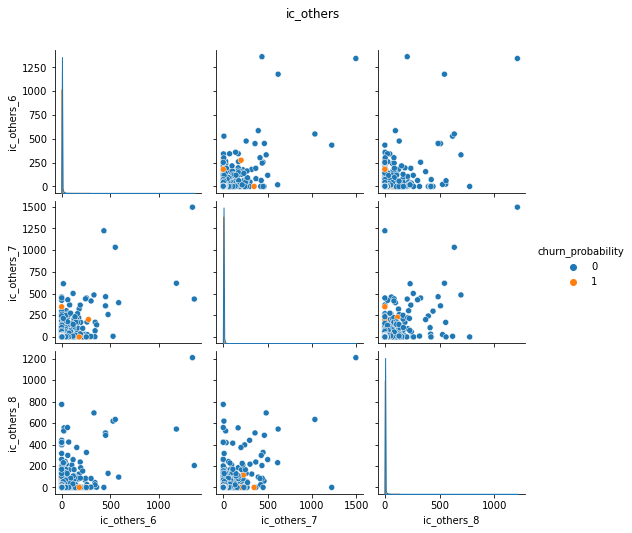

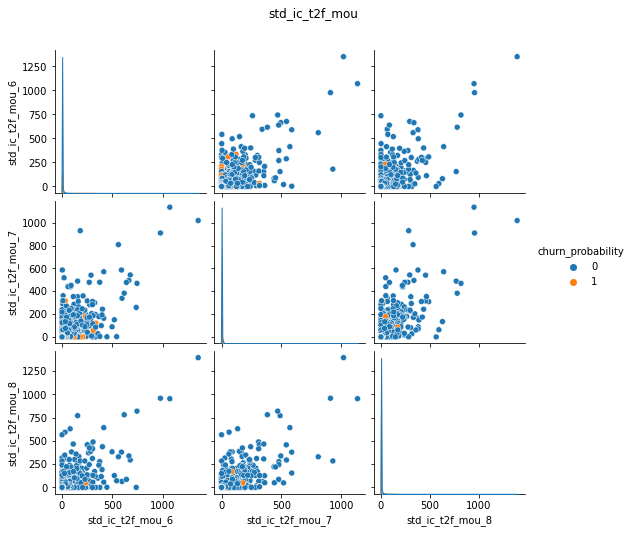

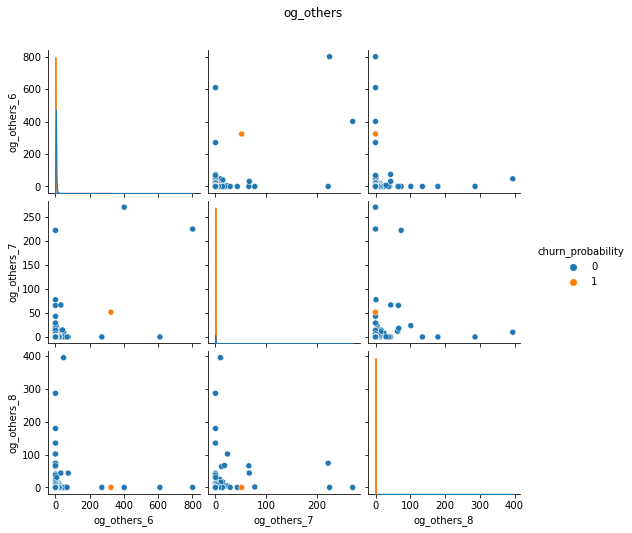

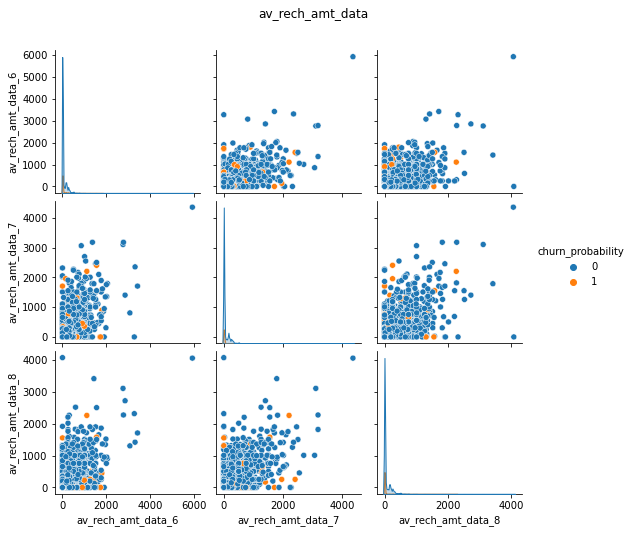

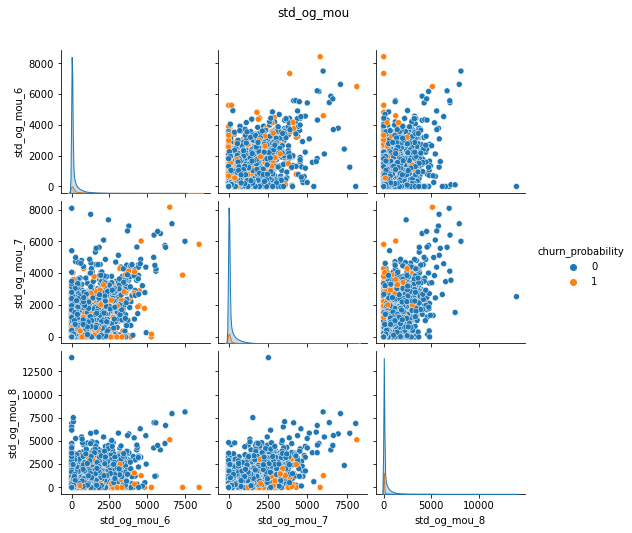

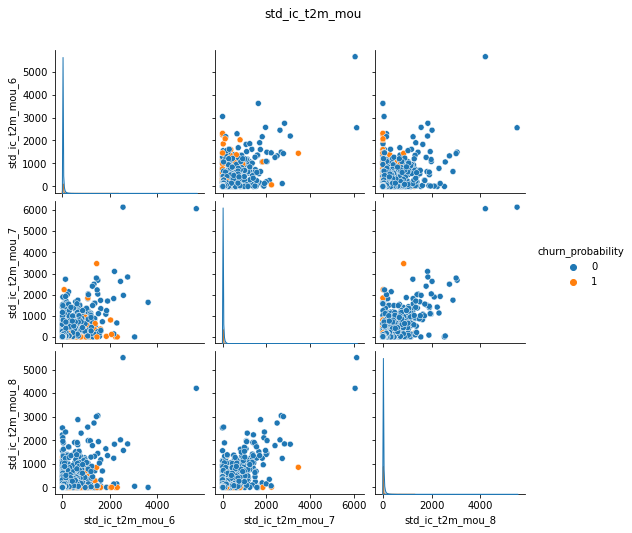

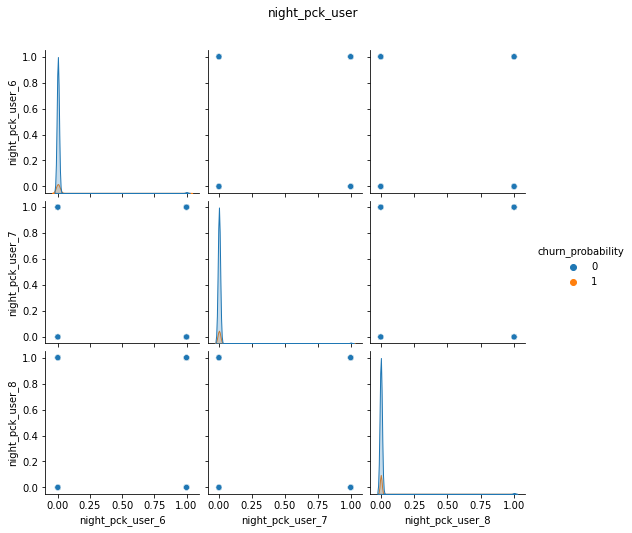

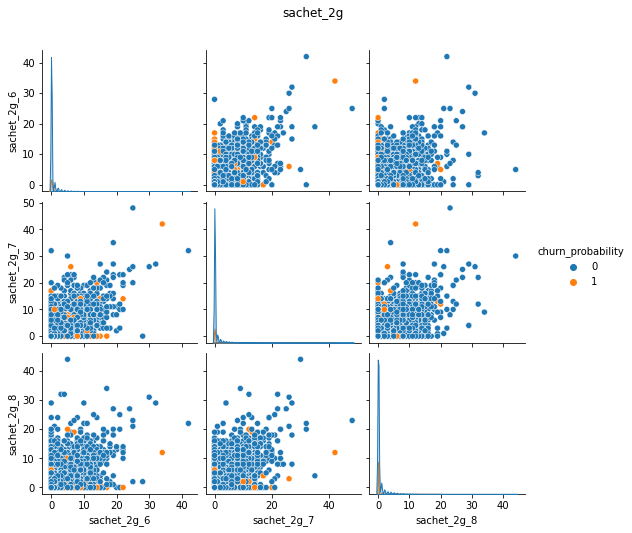

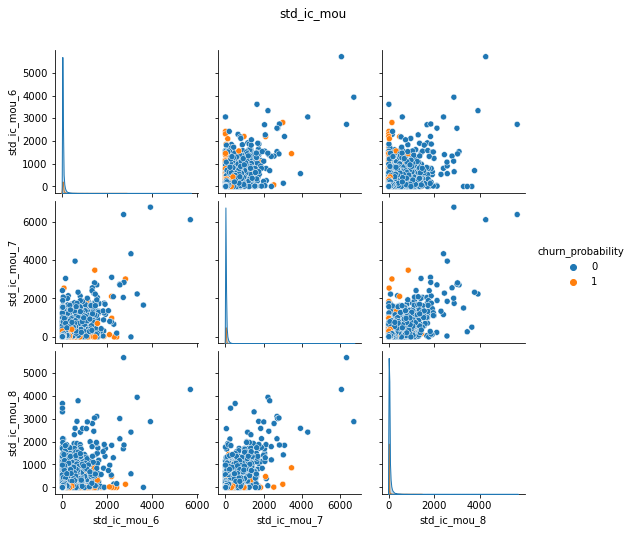

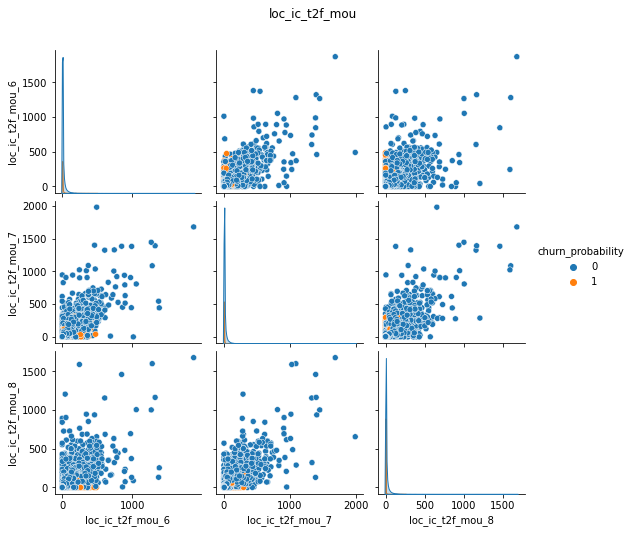

In [243]:
for feat in month_feats[15:25]:
    print(f'working on -- {feat}')
    create_pairplot(feat)

working on -- date_of_last_rech_data_
working on -- arpu_2g_
working on -- arpu_3g_
working on -- total_rech_amt_
working on -- fb_user_
working on -- loc_ic_mou_
working on -- spl_ic_mou_
working on -- std_og_t2f_mou_
working on -- loc_ic_t2t_mou_
working on -- spl_og_mou_


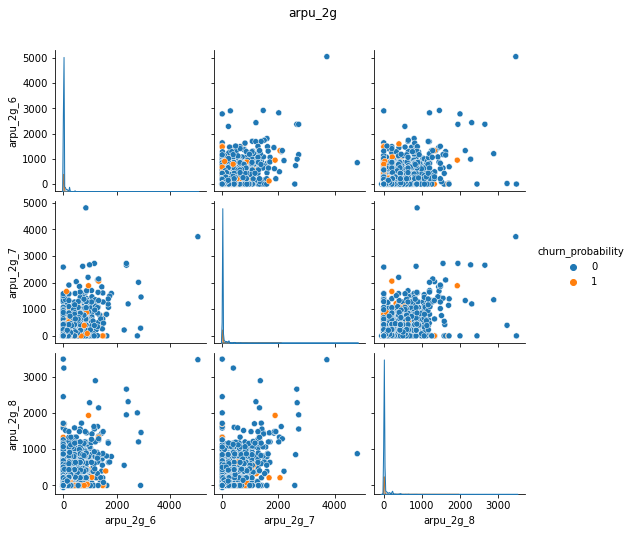

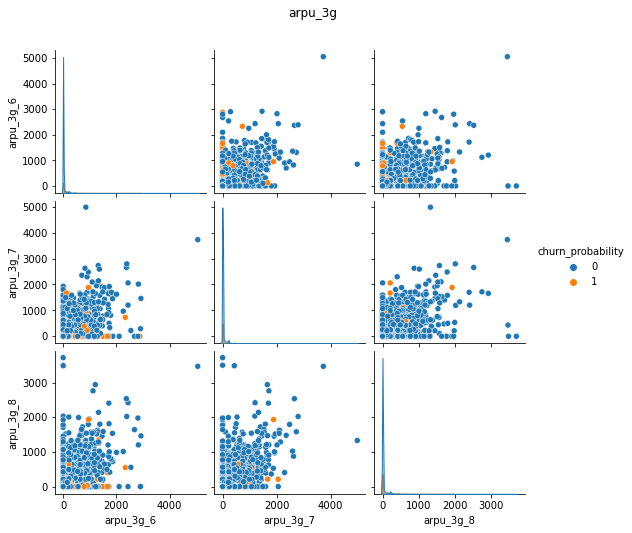

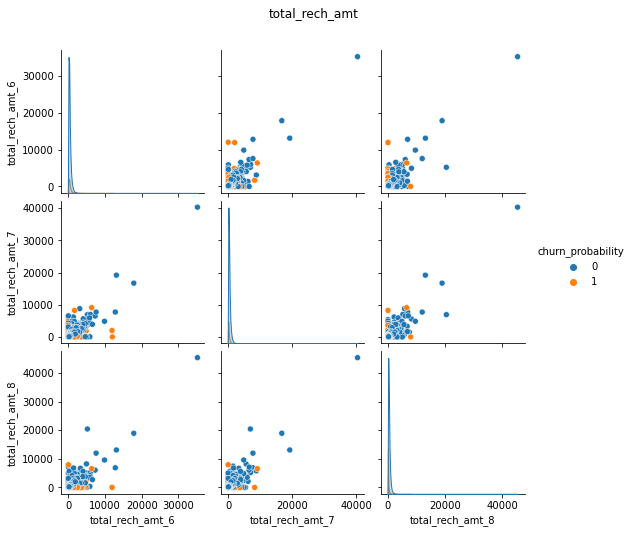

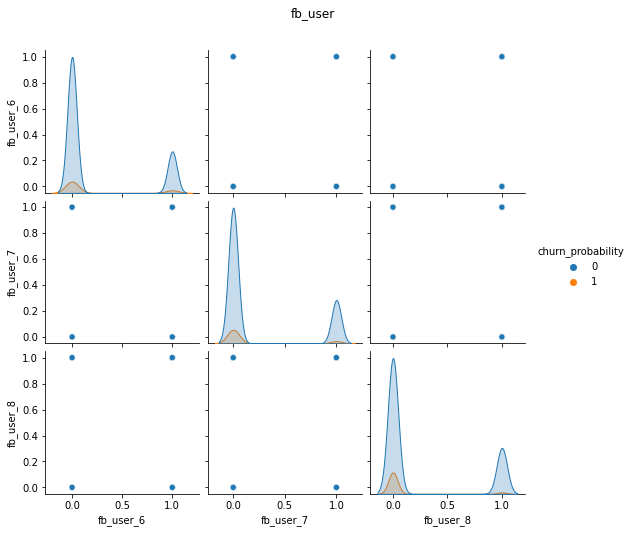

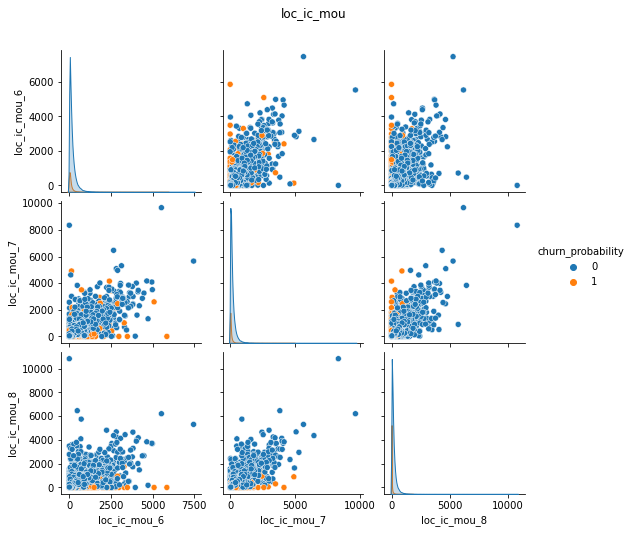

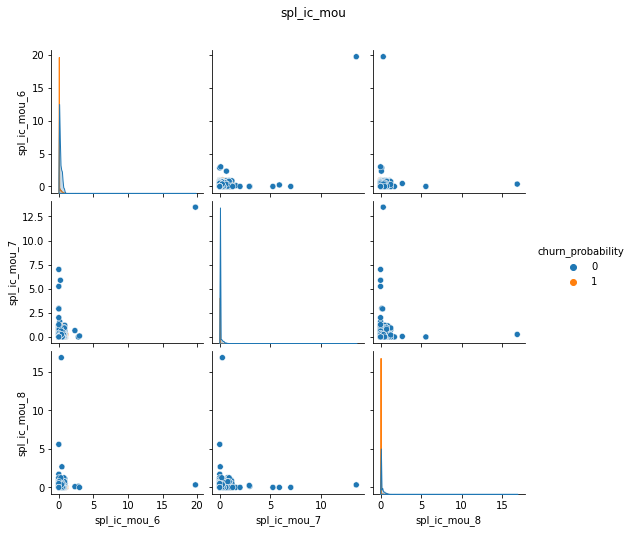

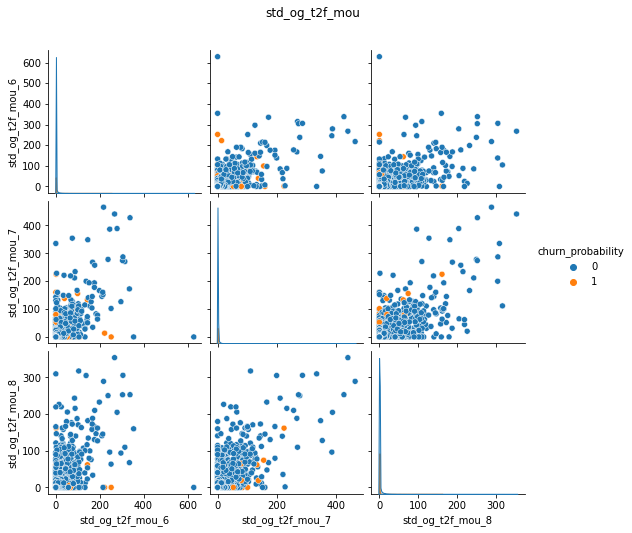

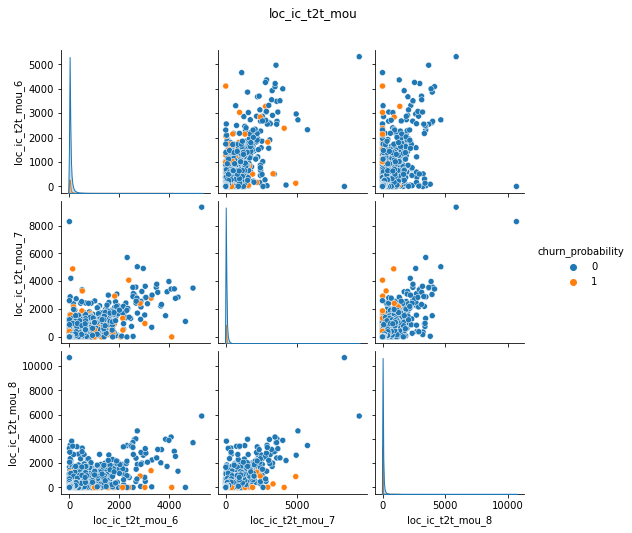

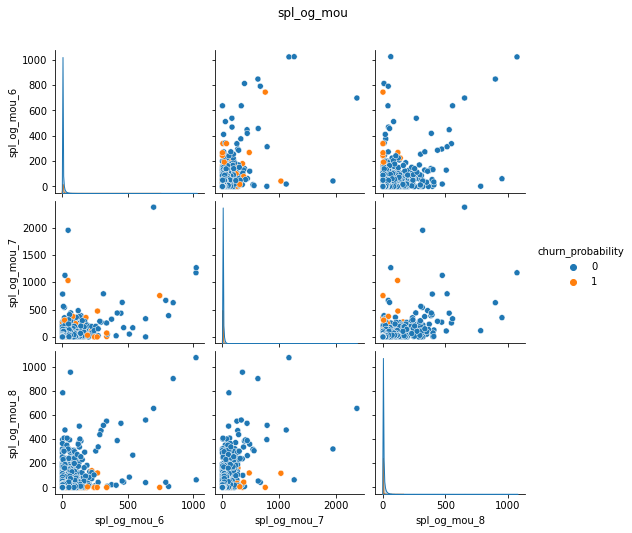

In [245]:
for feat in month_feats[25:35]:
    try:
        print(f'working on -- {feat}')
        create_pairplot(feat)
    except:
        pass

working on -- isd_ic_mou_
working on -- roam_og_mou_
working on -- total_og_mou_
working on -- max_rech_data_
working on -- loc_og_t2m_mou_
working on -- date_of_last_rech_
working on -- loc_og_t2f_mou_
working on -- vol_3g_mb_
working on -- std_ic_t2t_mou_
working on -- total_ic_mou_


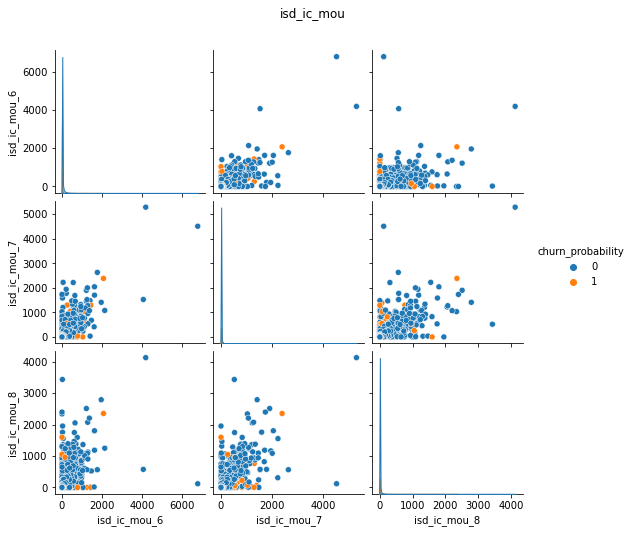

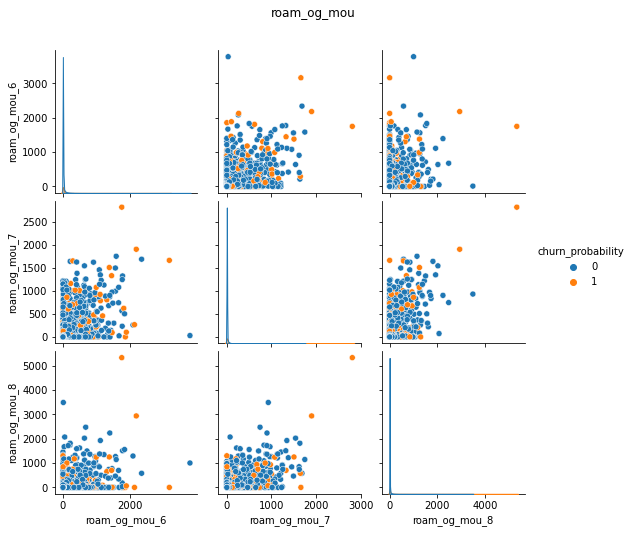

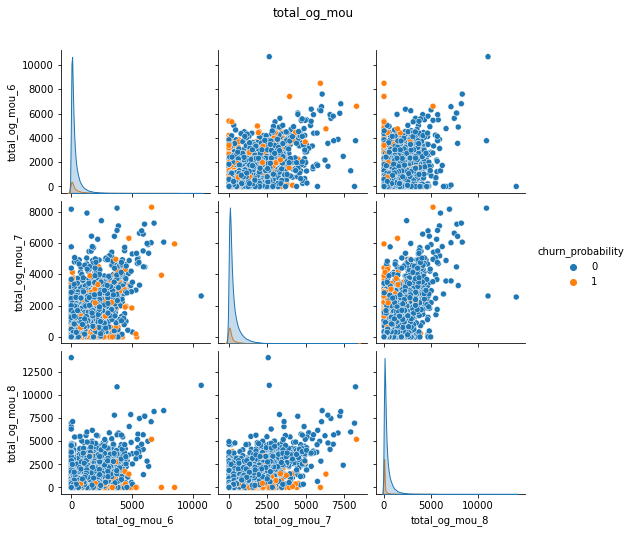

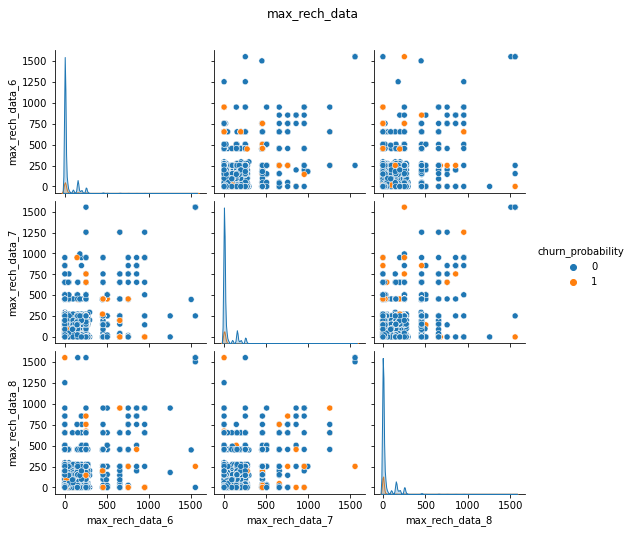

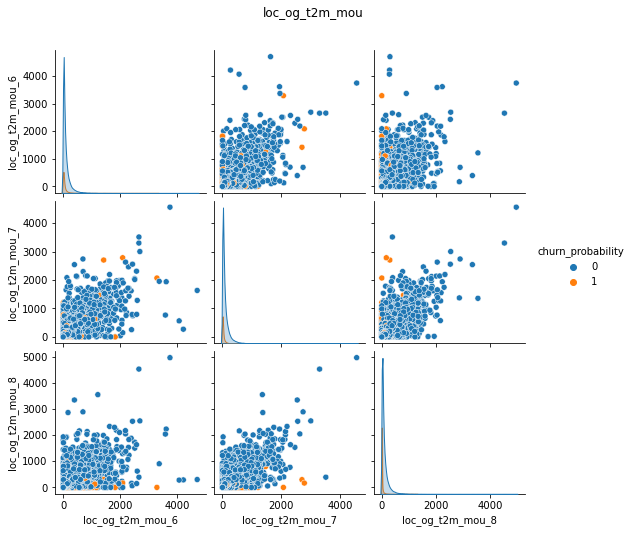

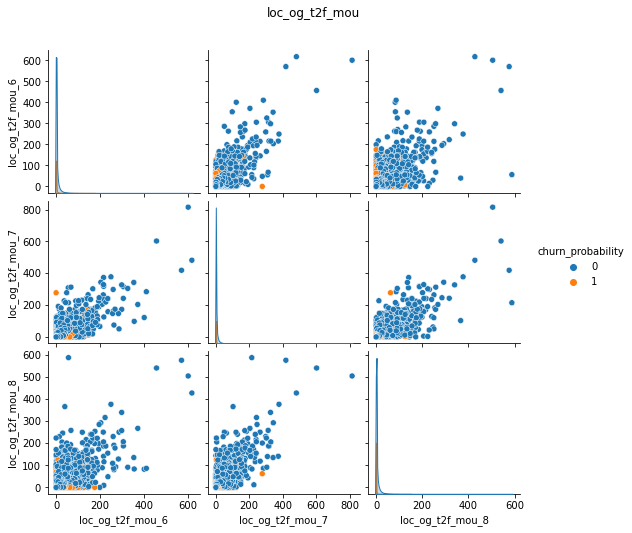

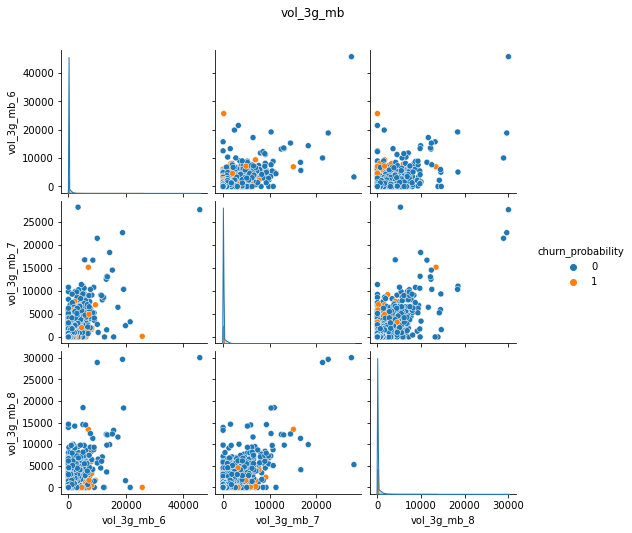

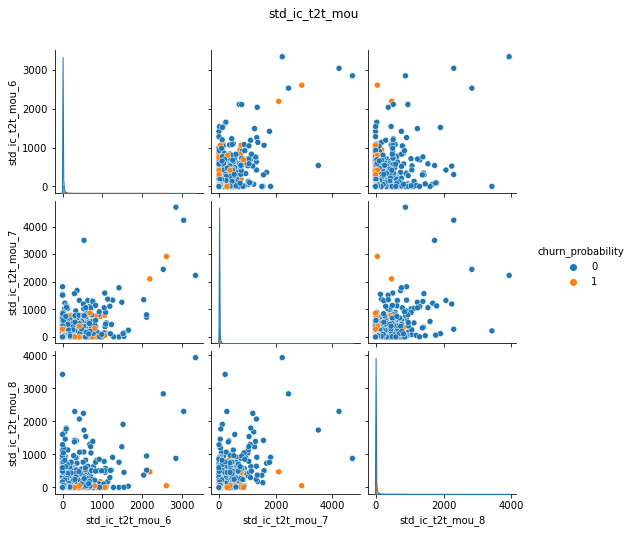

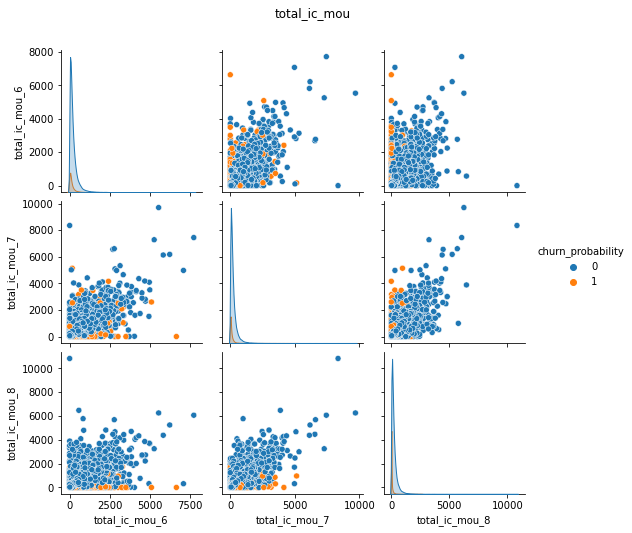

In [246]:
for feat in month_feats[35:45]:
    try:
        print(f'working on -- {feat}')
        create_pairplot(feat)
    except:
        pass

working on -- sachet_3g_
working on -- isd_og_mou_
working on -- loc_og_t2c_mou_
working on -- loc_og_t2t_mou_
working on -- std_og_t2t_mou_
working on -- arpu_


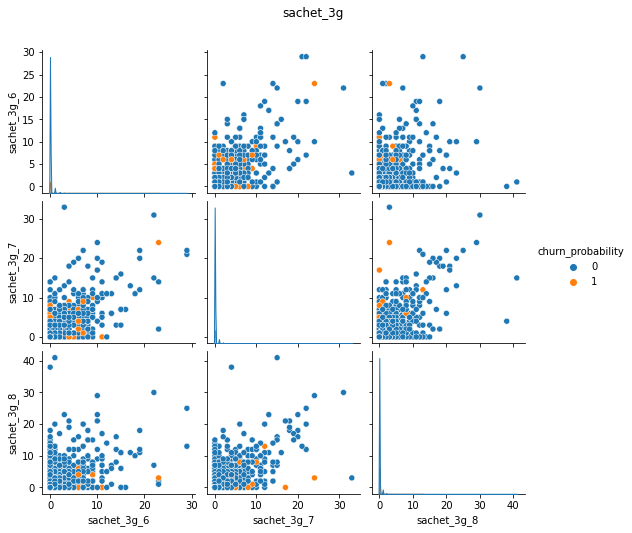

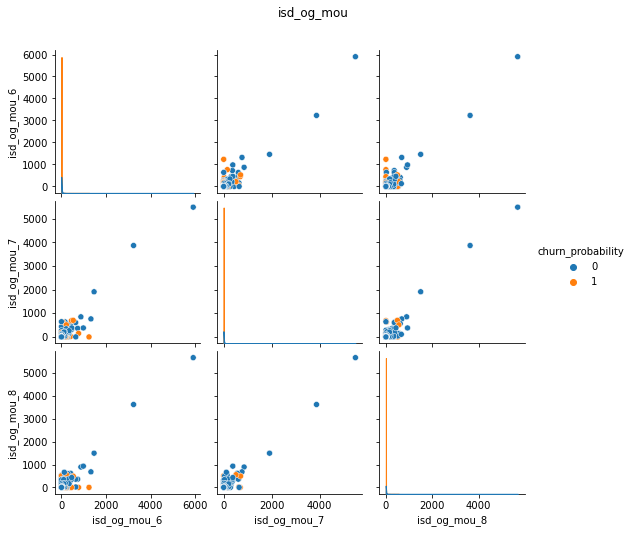

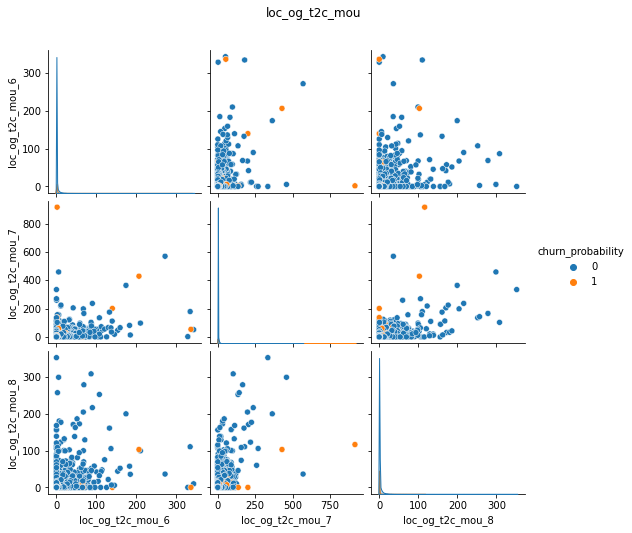

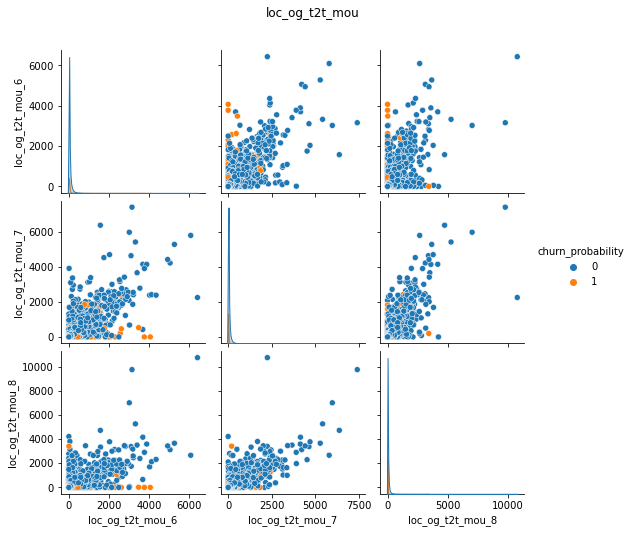

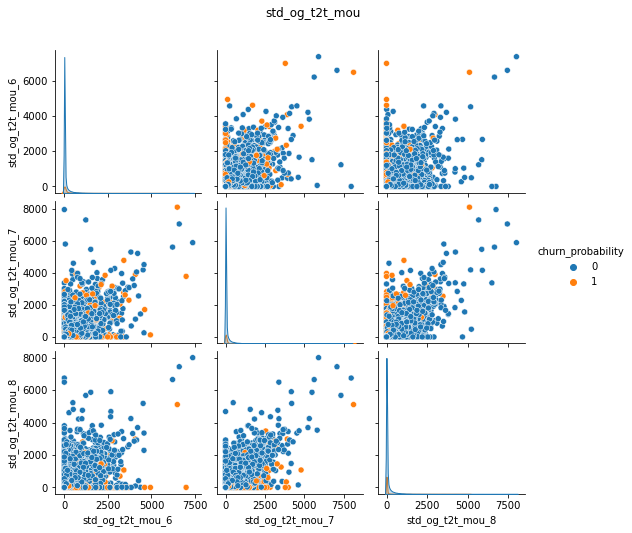

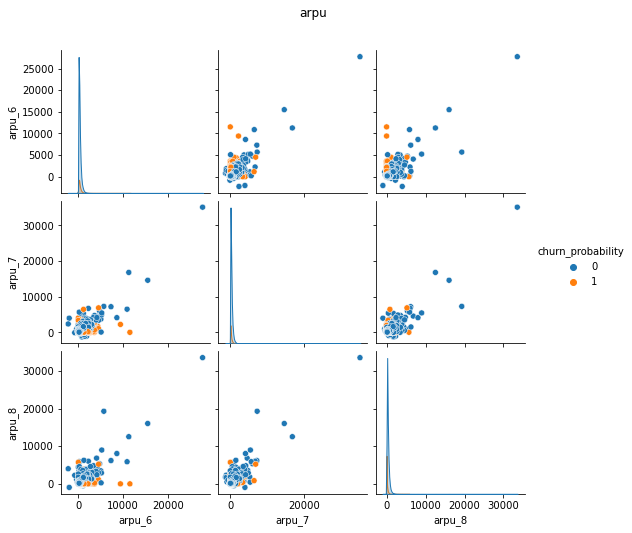

In [247]:

for feat in month_feats[45:]:
    try:
        print(f'working on -- {feat}')
        create_pairplot(feat)
    except:
        pass

In [258]:
test_df.columns.difference([f'{i}{x}' for i in month_feats for x in [6,7,8]])

Index(['aon', 'week_no_of_last_rech_6', 'week_no_of_last_rech_7',
       'week_no_of_last_rech_8', 'week_no_of_last_rech_data_6',
       'week_no_of_last_rech_data_7', 'week_no_of_last_rech_data_8'],
      dtype='object')

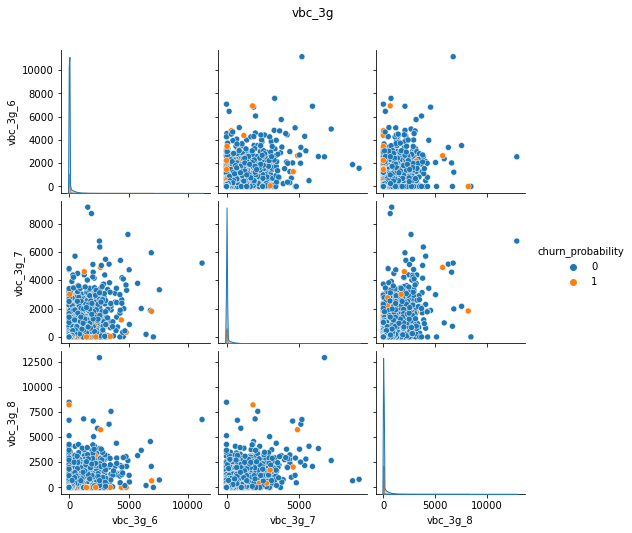

In [260]:
create_pairplot('vbc_3g_')

#### We observe that for most of the products, for the 8th month the customers who churned have their values hugging near to zero
- We'll use this information while creating new augmented featuress

<AxesSubplot:xlabel='churn_probability', ylabel='aon'>

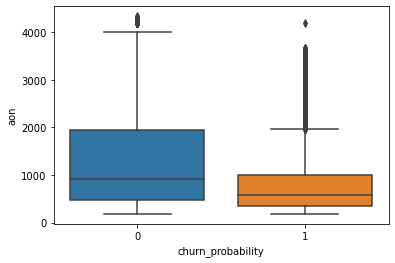

In [261]:
sns.boxplot(data = train_df, x  = 'churn_probability', y = 'aon')

#### observing correlations with heatmaps.
- since we have loads of features, it makes it very difficult to visualize them at once. We'll visualize the continous and categorical features seperately 

### We know  calculating Pearsons correlation is not advisable for nominal - nominal and nominal - continuous features. so we'll calculate them with differnt methods. namely:
- nominal - nominal = cramer
- numeric - numeric   = pearson
- numeric - nominal = correlation_ratio

In [66]:
num_feat = [x for x in num_feat if x not in ['aug_vbc_3g', 'id', 'jul_vbc_3g', 'jun_vbc_3g']]

In [67]:
num_feat[:5]

['aon', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_3g_6']

In [68]:
cat_feat

Index(['churn_probability', 'night_pck_user_8', 'night_pck_user_7',
       'night_pck_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_6',
       'monthly_2g_6', 'week_no_of_last_rech_data_6', 'week_no_of_last_rech_8',
       'week_no_of_last_rech_7', 'week_no_of_last_rech_6',
       'week_no_of_last_rech_data_7', 'week_no_of_last_rech_data_8',
       'monthly_2g_7'],
      dtype='object')

In [69]:
train_df['monthly_2g_8'].unique()

array([0, 1, 2, 4, 3, 5])

In [70]:
cat_ordinal = ['monthly_2g_6',
       'monthly_2g_8', 'week_no_of_last_rech_data_8',
       'week_no_of_last_rech_data_7', 'week_no_of_last_rech_data_6',
       'week_no_of_last_rech_8', 'week_no_of_last_rech_7',
       'week_no_of_last_rech_6']

In [71]:
cat_nominal = ['fb_user_6', 'fb_user_7', 'night_pck_user_6',
       'night_pck_user_7', 'night_pck_user_8', 'fb_user_8']

In [72]:
target_feat = 'churn_probability'

In [81]:
ass_numeric = associations(train_df[[*num_feat, *cat_ordinal, target_feat]], numerical_columns=None, mark_columns=False, nom_nom_assoc='cramer', num_num_assoc='pearson', ax=None, figsize=None, annot=True, fmt='.2f', cmap=None, sv_color='silver', cbar=True, vmax=1.0, vmin=None, plot=False, compute_only=True, clustering=False, title=None, filename=None)


In [308]:
pyplot.figure(figsize=[165,165])
sns_heatmap = sns.heatmap(ass_numeric['corr'],annot=True, cmap='vlag')

<AxesSubplot:>

#### The heatmap seems very jumbled due to high dimensionality of our data. we can save this heatmap and analyze it in an image viewer with zoom functionality

In [ ]:
fig = sns_heatmap.get_figure()
fig.savefig("./tmp/heatmap.png") 

In [303]:
ass_cat = associations(train_df[[*cat_nominal, target_feat]], numerical_columns=None, mark_columns=False, nom_nom_assoc='cramer', num_num_assoc='pearson', ax=None, figsize=None, annot=True, fmt='.2f', cmap=None, sv_color='silver', cbar=True, vmax=1.0, vmin=None, plot=False, compute_only=True, clustering=False, title=None, filename=None)


<AxesSubplot:>

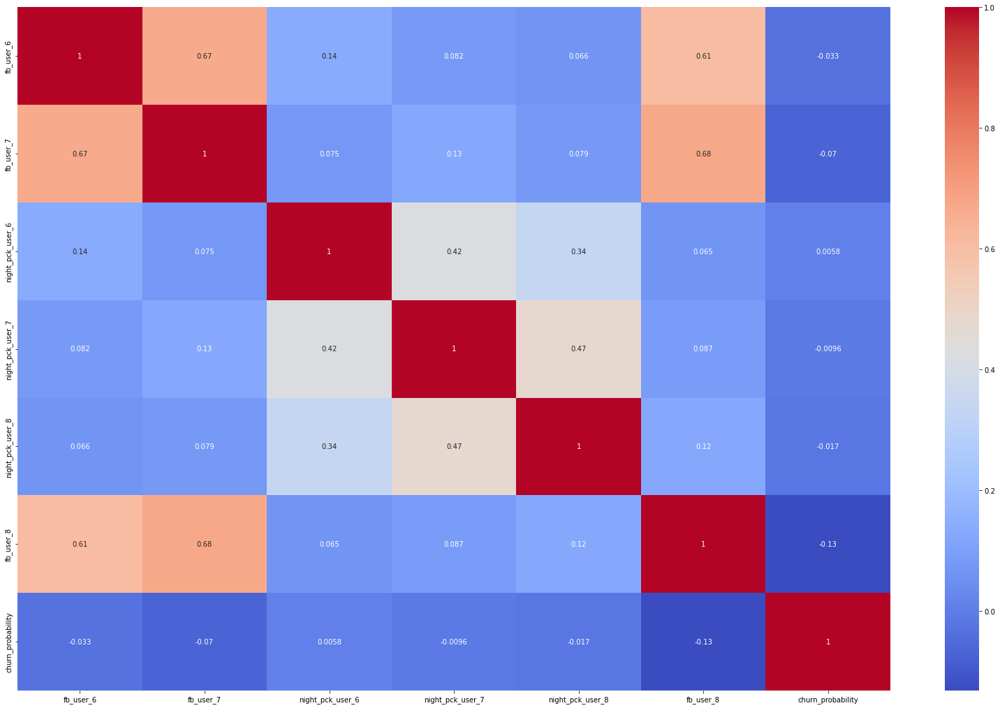

In [305]:
pyplot.figure(figsize=[28,18])
sns.heatmap(ass_cat['corr'],annot=True, cmap='coolwarm')

### Feature Engineering (contd.) (part 2)

In [73]:
train_df.shape, test_df.shape

((69999, 158), (30000, 157))

In [74]:
train_df_og = train_df.copy()
test_df_og = test_df.copy()

In [75]:
# train_df = train_df_og.copy()
# test_df = test_df_og.copy()

In [81]:
cat_feat_new = train_df.nunique().sort_values()[:18].index

In [82]:
num_feat_new = test_df.columns.difference(cat_feat_new)

In [83]:
month_feats = [x for x in month_feats if x not in ['date_of_last_rech_data_', 'date_of_last_rech_']]; len(month_feats)

50

In [85]:
month_feats[10]

'loc_og_t2m_mou_'

#### We will augment new features from the features about differnt months
- We will create new features (product_aug_diff) by substarcting the august month features from the average of june and july

In [86]:
for feat in month_feats:
    new_feat = f'{feat}aug_diff'
    print(f'applying new feat -- {new_feat} on train and test data')
    train_df[new_feat] = train_df[f'{feat}8'] - (train_df[f'{feat}6'] + train_df[f'{feat}7'])/2
    test_df[new_feat] = test_df[f'{feat}8'] - (test_df[f'{feat}6'] + test_df[f'{feat}7'])/2

applying new feat -- ic_others_aug_diff on train and test data
applying new feat -- arpu_3g_aug_diff on train and test data
applying new feat -- sachet_2g_aug_diff on train and test data
applying new feat -- arpu_2g_aug_diff on train and test data
applying new feat -- isd_og_mou_aug_diff on train and test data
applying new feat -- max_rech_amt_aug_diff on train and test data
applying new feat -- total_ic_mou_aug_diff on train and test data
applying new feat -- count_rech_2g_aug_diff on train and test data
applying new feat -- onnet_mou_aug_diff on train and test data
applying new feat -- std_ic_t2m_mou_aug_diff on train and test data
applying new feat -- loc_og_t2m_mou_aug_diff on train and test data
applying new feat -- std_og_t2m_mou_aug_diff on train and test data
applying new feat -- std_ic_mou_aug_diff on train and test data
applying new feat -- count_rech_3g_aug_diff on train and test data
applying new feat -- std_og_t2f_mou_aug_diff on train and test data
applying new feat -- to

In [87]:
train_df.shape, test_df.shape

((69999, 208), (30000, 207))

In [88]:
month_feats[0]

'ic_others_'

In [89]:
train_df[['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_num_aug_diff']].head()

,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_aug_diff
0,3,2,2,-0.5
1,3,4,5,1.5
2,2,4,2,-1.0
3,2,4,3,0.0
4,13,10,8,-3.5


In [90]:
train_df.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,week_no_of_last_rech_6,week_no_of_last_rech_7,week_no_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,week_no_of_last_rech_data_6,week_no_of_last_rech_data_7,week_no_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,churn_probability,ic_others_aug_diff,arpu_3g_aug_diff,sachet_2g_aug_diff,arpu_2g_aug_diff,isd_og_mou_aug_diff,max_rech_amt_aug_diff,total_ic_mou_aug_diff,count_rech_2g_aug_diff,onnet_mou_aug_diff,std_ic_t2m_mou_aug_diff,loc_og_t2m_mou_aug_diff,std_og_t2m_mou_aug_diff,std_ic_mou_aug_diff,count_rech_3g_aug_diff,std_og_t2f_mou_aug_diff,total_rech_data_aug_diff,fb_user_aug_diff,sachet_3g_aug_diff,loc_og_t2c_mou_aug_diff,std_og_t2t_mou_aug_diff,vol_3g_mb_aug_diff,vol_2g_mb_aug_diff,spl_ic_mou_aug_diff,std_og_mou_aug_diff,arpu_aug_diff,last_day_rch_amt_aug_diff,loc_og_mou_aug_diff,monthly_3g_aug_diff,total_rech_amt_aug_diff,loc_og_t2f_mou_aug_diff,loc_ic_t2t_mou_aug_diff,offnet_mou_aug_diff,loc_ic_t2f_mou_aug_diff,loc_og_t2t_mou_aug_diff,spl_og_mou_aug_diff,total_rech_num_aug_diff,max_rech_data_aug_diff,monthly_2g_aug_diff,std_ic_t2f_mou_aug_diff,og_others_aug_diff,roam_og_mou_aug_diff,std_ic_t2t_mou_aug_diff,night_pck_user_aug_diff,loc_ic_mou_aug_diff,roam_ic_mou_aug_diff,loc_ic_t2m_mou_aug_diff,isd_ic_mou_aug_diff,av_rech_amt_data_aug_diff,total_og_mou_aug_diff,vbc_3g_aug_diff
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,4.0,2.0,4.0,65,65,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

#### transforming categorical features

In [91]:
train_df[cat_nominal].nunique()

fb_user_6           2
fb_user_7           2
night_pck_user_6    2
night_pck_user_7    2
night_pck_user_8    2
fb_user_8           2
dtype: int64

##### our nominal categorical features looks in the right shape as there are not more than 2 unique values. no further conversion needed

In [92]:
from sklearn.model_selection import train_test_split

In [93]:
from sklearn.preprocessing import StandardScaler

In [94]:
copy_train_df = train_df.copy()
copy_test_df = test_df.copy()

In [95]:
X_train, X_test, y_train, y_test = train_test_split(train_df.drop(target_feat, 1), train_df[target_feat], test_size=0.2, random_state=10, stratify=train_df[target_feat])


/var/folders/z0/wbc1b27j3r5102_79kyb6hyr0000gn/T/ipykernel_71144/3215426946.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_train, X_test, y_train, y_test = train_test_split(train_df.drop(target_feat, 1), train_df[target_feat], test_size=0.2, random_state=10, stratify=train_df[target_feat])


In [96]:
y_train.value_counts(1)

0    0.898105
1    0.101895
Name: churn_probability, dtype: float64

In [97]:
y_test.value_counts(1)

0    0.898143
1    0.101857
Name: churn_probability, dtype: float64

#### Scaling numeric features

In [98]:
scaler = StandardScaler() 

In [99]:
X_train[num_feat] = scaler.fit_transform(X_train[num_feat]) # scaling train features

In [100]:
X_test[num_feat] = scaler.transform(X_test[num_feat]) # scaling test features

#### we won't be scaling target variable for interpretation reasons

### Modelling

In [101]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

#### baseline LR model

#### functions for model evaluation

In [725]:
def evaluate_model(actual, pred):
    print(f' overall accuracy-- {metrics.accuracy_score(actual, pred)}')
    print(f' overall f1-- {metrics.f1_score(actual, pred)}')
    print('----------------classification report----------------')
    print(metrics.classification_report(actual, pred))
    print('----------------confussion matrix----------------')
    print(metrics.confusion_matrix(actual, pred))
    print(f'sensitivity -- {metrics.recall_score(actual, pred, pos_label=1)}')
    print(f'specificity -- {metrics.recall_score(actual, pred, pos_label=0)}')
    fpr, tpr, _ = metrics.roc_curve(actual, pred)
    print('----------------roc curve----------------')
    pyplot.plot(fpr, tpr)
    print(f' auc_roc-- {metrics.roc_auc_score(actual, pred)}')
    
    
    

In [465]:
def get_metrics(train_preds, test_preds, train_actual, test_actual, ):
    print(f'auc_roc (train) -- {metrics.roc_auc_score(train_actual, train_preds)}')
    print(f'auc_roc (test) -- {metrics.roc_auc_score(test_actual, test_preds)}')    
    print(f'f1 (train) -- {metrics.f1_score(train_actual, train_preds)}')
    print(f'f1 (test) -- {metrics.f1_score(test_actual, test_preds)}')    

In [128]:
clf1 = LogisticRegressionCV(cv=5, random_state=1, scoring = 'accuracy', max_iter = 1000).fit(train_df[train_df.columns.difference(['churn_probability'])], train_df['churn_probability'])


/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

In [129]:
clf1.scores_[1].mean(axis=0).max()

0.9169273723633321

In [131]:
clf2 = LogisticRegressionCV(cv=5, random_state=1, scoring = 'accuracy', max_iter=500).fit(X_train, y_train)


/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

 overall accuracy-- 0.5081428571428571
 overall f1-- 0.26179245283018865
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.97      0.47      0.63     12574
           1       0.15      0.86      0.26      1426

    accuracy                           0.51     14000
   macro avg       0.56      0.66      0.45     14000
weighted avg       0.88      0.51      0.59     14000

----------------confussion matrix----------------
[[5893 6681]
 [ 205 1221]]
sensitivity -- 0.46866550023858755
specificity -- 0.8562412342215989
----------------roc curve----------------
 auc_roc-- 0.6624533672300932


/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


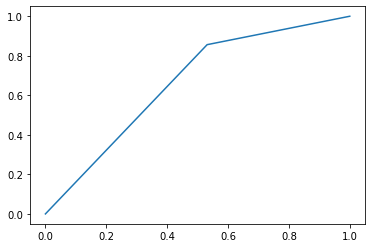

In [153]:
evaluate_model(y_test, clf1.predict(X_test))

 overall accuracy-- 0.9186428571428571
 overall f1-- 0.45632458233890216
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.93      0.98      0.96     12574
           1       0.71      0.34      0.46      1426

    accuracy                           0.92     14000
   macro avg       0.82      0.66      0.71     14000
weighted avg       0.91      0.92      0.91     14000

----------------confussion matrix----------------
[[12383   191]
 [  948   478]]
sensitivity -- 0.33520336605890605
specificity -- 0.984809925242564
----------------roc curve----------------
 auc_roc-- 0.6600066456507351


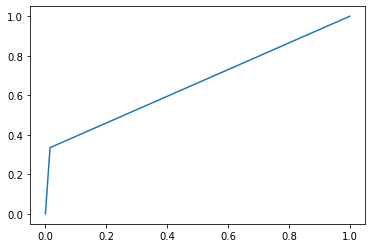

In [726]:
evaluate_model(y_test, clf2.predict(X_test))

In [724]:
get_metrics(clf2.predict(X_train), clf2.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.6600917257886662
auc_roc (test) -- 0.6600066456507351
f1 (train) -- 0.45465309022022254
f1 (test) -- 0.45632458233890216


#### As we observe although overall accuracy is quite good ~93, our sensitivity is quite low. I.E. we're not doing a very good job in predicting actual churn customers. We'll try and fix this with oversampling
- A good model for this problem should have a high sensitivity/ recall for the positivie class

In [727]:
def make_submissions(preds, name): # function to make submissions for kaggle
    tmp_sub = pd.DataFrame()
    tmp_sub['id'] = test_ids
    tmp_sub['churn_probability'] = preds
    tmp_sub.to_csv(f'./submissions/{name}', index = False)

In [157]:
make_submissions(clf2.predict(test_df,), 'lr_2.csv') # score - 0.89

In [423]:
metrics.roc_auc_score(y_test, rf_best.predict(X_test))

0.8690684667107332

In [159]:
clf3 = LogisticRegressionCV(cv=5, random_state=1, scoring = 'accuracy', max_iter=500, class_weight='balanced').fit(X_train, y_train)


/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

In [160]:
clf3.scores_[1].mean(axis=0).max()

0.8132823099638997

 overall accuracy-- 0.8157857142857143
 overall f1-- 0.487785501489573
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.98      0.81      0.89     12574
           1       0.34      0.86      0.49      1426

    accuracy                           0.82     14000
   macro avg       0.66      0.84      0.69     14000
weighted avg       0.92      0.82      0.85     14000

----------------confussion matrix----------------
[[10193  2381]
 [  198  1228]]
sensitivity -- 0.8106410052489263
specificity -- 0.8611500701262272
----------------roc curve----------------
 auc_roc-- 0.8358955376875769


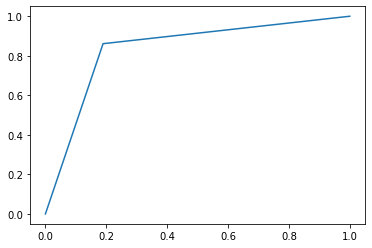

In [161]:
evaluate_model(y_test, clf3.predict(X_test))

In [162]:
make_submissions(clf3.predict(test_df,), 'lr_3.csv') # score - 0.89770

#### feature eng. (contd.)

In [105]:
from imblearn.over_sampling import SMOTE, SMOTENC
from imblearn.pipeline import make_pipeline

In [108]:
cat_feat_new

Index(['churn_probability', 'night_pck_user_8', 'night_pck_user_7',
       'night_pck_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_6',
       'monthly_2g_6', 'week_no_of_last_rech_data_6', 'week_no_of_last_rech_8',
       'week_no_of_last_rech_7', 'week_no_of_last_rech_6',
       'week_no_of_last_rech_data_7', 'week_no_of_last_rech_data_8',
       'monthly_2g_7', 'monthly_2g_8', 'monthly_3g_6', 'monthly_3g_8'],
      dtype='object')

In [110]:
cat_indexes = X_train.columns.get_indexer(cat_feat_new)[1:]

In [112]:
cat_indexes

array([137, 136, 135, 151, 152, 150, 138, 105, 101, 100,  99, 106, 107,
       139, 140, 144, 146])

In [115]:
y_train.value_counts()

0    50293
1     5706
Name: churn_probability, dtype: int64

#### We will upscale the minority(positive) class to get a better model fit
- We will try differnet upsampling ratios (sampling_startergy) towards the end of the NB while fine tuning our final model

In [113]:
sm_def = SMOTENC(random_state=10, sampling_strategy=  1.0, categorical_features = cat_indexes)
x_train_sm1, y_train_sm1 = sm_def.fit_resample(X_train, y_train)

In [116]:
y_train_sm1.value_counts()

0    50293
1    50293
Name: churn_probability, dtype: int64

In [117]:
clf4 = LogisticRegressionCV(cv=5, random_state=1, scoring = 'f1', max_iter=500).fit(x_train_sm1, y_train_sm1)


/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

In [118]:
clf4.scores_[1].mean(axis=0).max()

0.8619741633397424

 overall accuracy-- 0.8255714285714286
 overall f1-- 0.4865433137089991
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.97      0.83      0.89     12574
           1       0.35      0.81      0.49      1426

    accuracy                           0.83     14000
   macro avg       0.66      0.82      0.69     14000
weighted avg       0.91      0.83      0.85     14000

----------------confussion matrix----------------
[[10401  2173]
 [  269  1157]]
sensitivity -- 0.8113604488078542
specificity -- 0.8271830761889614
----------------roc curve----------------
 auc_roc-- 0.8192717624984078


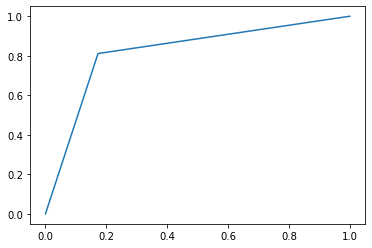

In [728]:
evaluate_model(y_test, clf4.predict(X_test))

In [729]:
get_metrics(clf4.predict(X_train), clf4.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8228364242601098
auc_roc (test) -- 0.8192717624984078
f1 (train) -- 0.4900551036473366
f1 (test) -- 0.4865433137089991


In [120]:
make_submissions(clf4.predict(test_df,), 'lr_4.csv') 

#### Tree based models (baseline)

In [196]:
dt = DecisionTreeClassifier()
rf = RandomForestClassifier(oob_score=True, n_jobs=-1)

In [197]:
dt.fit(X_train, y_train)

DecisionTreeClassifier()

 overall accuracy-- 0.9108571428571428
 overall f1-- 0.5834445927903872
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.96      0.94      0.95     12574
           1       0.56      0.61      0.58      1426

    accuracy                           0.91     14000
   macro avg       0.76      0.78      0.77     14000
weighted avg       0.91      0.91      0.91     14000

----------------confussion matrix----------------
[[11878   696]
 [  552   874]]
sensitivity -- 0.6129032258064516
specificity -- 0.9446476857006522
----------------roc curve----------------
 auc_roc-- 0.7787754557535519


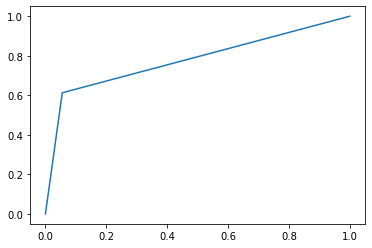

In [730]:
evaluate_model(y_test, dt.predict(X_test))

In [731]:
get_metrics(dt.predict(X_train), dt.predict(X_test),y_train, y_test )

auc_roc (train) -- 1.0
auc_roc (test) -- 0.7787754557535519
f1 (train) -- 1.0
f1 (test) -- 0.5834445927903872


##### default decision tree is overfitting

In [200]:
make_submissions(dt.predict(test_df,), 'dt_1.csv') 

In [201]:
rf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, oob_score=True)

In [205]:
rf.oob_score_

0.9411596635654208

 overall accuracy-- 0.943
 overall f1-- 0.6865671641791045
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12574
           1       0.78      0.61      0.69      1426

    accuracy                           0.94     14000
   macro avg       0.87      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000

----------------confussion matrix----------------
[[12328   246]
 [  552   874]]
sensitivity -- 0.6129032258064516
specificity -- 0.9804358199459201
----------------roc curve----------------
 auc_roc-- 0.7966695228761858


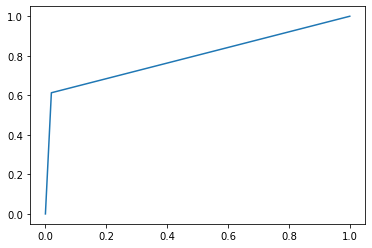

In [732]:
evaluate_model(y_test, rf.predict(X_test))

In [733]:
get_metrics(rf.predict(X_train), rf.predict(X_test),y_train, y_test )

auc_roc (train) -- 1.0
auc_roc (test) -- 0.7966695228761858
f1 (train) -- 1.0
f1 (test) -- 0.6865671641791045


In [203]:
make_submissions(rf.predict(test_df,), 'rf_1.csv') # score - 0.89770

#### Boosting(baseline)

In [208]:
ada = AdaBoostClassifier()
xgb = XGBClassifier()

In [209]:
ada.fit(X_train, y_train)

AdaBoostClassifier()

 overall accuracy-- 0.9404285714285714
 overall f1-- 0.684330052990159
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12574
           1       0.74      0.63      0.68      1426

    accuracy                           0.94     14000
   macro avg       0.85      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000

----------------confussion matrix----------------
[[12262   312]
 [  522   904]]
sensitivity -- 0.6339410939691444
specificity -- 0.9751868935899475
----------------roc curve----------------
 auc_roc-- 0.804563993779546


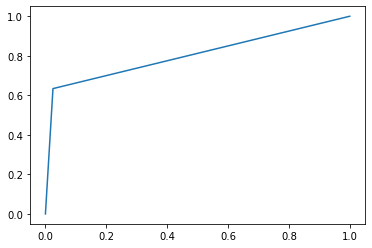

In [734]:
evaluate_model(y_test, ada.predict(X_test))

In [735]:
get_metrics(ada.predict(X_train), ada.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.7917859963118753
auc_roc (test) -- 0.804563993779546
f1 (train) -- 0.6661548795700988
f1 (test) -- 0.684330052990159


In [211]:
make_submissions(ada.predict(test_df,), 'ada_1.csv') # score - 0.89770

In [438]:
metrics.f1_score(y_train, ada.predict(X_train))

0.6661548795700988

In [439]:
metrics.f1_score(y_test, ada.predict(X_test))

0.684330052990159

In [212]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

 overall accuracy-- 0.9417857142857143
 overall f1-- 0.6925688419464353
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12574
           1       0.75      0.64      0.69      1426

    accuracy                           0.94     14000
   macro avg       0.85      0.81      0.83     14000
weighted avg       0.94      0.94      0.94     14000

----------------confussion matrix----------------
[[12267   307]
 [  508   918]]
sensitivity -- 0.6437587657784011
specificity -- 0.975584539526006
----------------roc curve----------------
 auc_roc-- 0.8096716526522038


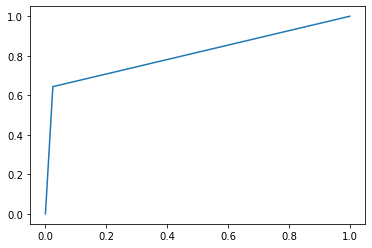

In [740]:
evaluate_model(y_test, xgb.predict(X_test))

In [736]:
get_metrics(xgb.predict(X_train), xgb.predict(X_test),y_train, y_test ) # overfitting

auc_roc (train) -- 0.9375829981210214
auc_roc (test) -- 0.8096716526522038
f1 (train) -- 0.9000267546597699
f1 (test) -- 0.6925688419464353


In [214]:
make_submissions(xgb.predict(test_df,), 'xgb_1.csv') # score - 0.89770

In [436]:
metrics.f1_score(y_train, xgb.predict(X_train))

0.9000267546597699

In [437]:
metrics.f1_score(y_test, xgb.predict(X_test))

0.6925688419464353

#### Optimizing hyperparameters with CV

In [128]:
y_train.value_counts()

0    50293
1     5706
Name: churn_probability, dtype: int64

In [129]:
50293/5706

8.814055380301436

In [175]:
param_range = [1, 2, 3, 4, 5, 6]
min_leaf_size = [5,25,50,75, 100]
max_depth_range = [5, 10, 20, 25, 50]
param_range_fl = [1.0,0.8, 0.5, 0.1]
n_estimators = [50,100,150, 200, 500]
learning_rates = [0.05,0.1,0.2,0.3]
class_weight = [None, 'balanced']

lr_param_grid = [{'penalty': ['l1', 'l2'],
                   'C': param_range_fl,
                   'solver': ['saga'],
                    'class_weight': class_weight}]
dt_param_grid = [{'criterion': ['gini',],
                   'min_samples_leaf': min_leaf_size,
                   'max_depth': max_depth_range,
                   'min_samples_split': min_leaf_size,
                    'max_features': ['sqrt', 'log2', None],
                     'class_weight': class_weight}]
rf_param_grid = [{'min_samples_leaf': min_leaf_size,
                   'max_depth': max_depth_range,
                   'min_samples_split': min_leaf_size,
                  'max_features': ['sqrt', 'log2', None],
                     'class_weight': class_weight}]
xgb_param_grid = [{'learning_rate': learning_rates,
                    'max_depth': [3, 5, 8, 10],
                    'min_child_weight': param_range,
                    'subsample': param_range_fl,
                    'n_estimators': n_estimators,
                     'scale_pos_weight': [1, 9, 25, 50, 100],
                      'reg_alpha': [1e-5, 1e-2, 0.1, 1, 100]}]
ada_param_grid = [{'n_estimators': n_estimators,
                   'learning_rate': [0.1, 0.3, 0.5, 1]}]

In [180]:
lr_grid_search = GridSearchCV(estimator=LogisticRegression(),
        param_grid=lr_param_grid,
        scoring='f1',
        cv=3,
        verbose=0,
        n_jobs= -1 )
dt_grid_search = GridSearchCV(estimator=DecisionTreeClassifier(),
        param_grid=dt_param_grid,
        scoring='f1',
        cv=3,
        verbose=0,
        n_jobs= -1 )
rf_grid_search = GridSearchCV(estimator=RandomForestClassifier(),
        param_grid=rf_param_grid,
        scoring='f1',
        cv=3,
        verbose=0,
        n_jobs= -1 )
xgb_grid_search = GridSearchCV(estimator=XGBClassifier(),
        param_grid=xgb_param_grid,
        scoring='f1',
        cv=3,
        verbose=0,
        n_jobs= -1 )
ada_grid_search = GridSearchCV(estimator = AdaBoostClassifier(),
                              param_grid = ada_param_grid,
                               scoring = 'f1',
                               cv = 3,
                                verbose=0,
                                n_jobs= -1 )

In [181]:
grids = [lr_grid_search, dt_grid_search, rf_grid_search, xgb_grid_search, ada_grid_search]

In [182]:
import time

In [183]:
for pipe in grids:
    tic = time.time()
    print(f'working on -- {str(pipe.estimator)}')
    pipe.fit(X_train,y_train)
    toc = time.time()
    print(f'done. time taken -- {(toc - tic)/60} mins')

working on -- LogisticRegression()


/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

done. time taken -- 6.394541597366333 mins
working on -- DecisionTreeClassifier()
done. time taken -- 33.53897273540497 mins
working on -- RandomForestClassifier()



KeyboardInterrupt



##### Since RF is taking a lot time with gridsearch, we'll reduce the search scope

In [185]:
lr_grid_search.best_params_

{'C': 1.0, 'class_weight': None, 'penalty': 'l2', 'solver': 'saga'}

In [186]:
dt_grid_search.best_params_

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': 5,
 'max_features': None,
 'min_samples_leaf': 75,
 'min_samples_split': 5}

In [189]:
dt_grid_search.best_score_

0.6745713104272159

In [190]:
lr_grid_search.best_score_

0.39659890811110543

 overall accuracy-- 0.943
 overall f1-- 0.6911764705882353
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12574
           1       0.77      0.63      0.69      1426

    accuracy                           0.94     14000
   macro avg       0.86      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000

----------------confussion matrix----------------
[[12309   265]
 [  533   893]]
sensitivity -- 0.6262272089761571
specificity -- 0.9789247653888977
----------------roc curve----------------
 auc_roc-- 0.8025759871825274


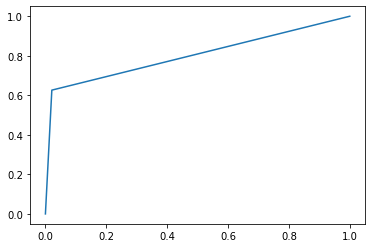

In [739]:
evaluate_model(y_test, dt_grid_search.predict(X_test))

In [737]:
get_metrics(dt_grid_search.predict(X_train), dt_grid_search.predict(X_test),y_train, y_test ) # overfitting

auc_roc (train) -- 0.7907265823257136
auc_roc (test) -- 0.8025759871825274
f1 (train) -- 0.677059694129255
f1 (test) -- 0.6911764705882353


In [194]:
make_submissions(dt_grid_search.predict(test_df,), 'dt_b.csv')

In [195]:
make_submissions(lr_grid_search.predict(test_df,), 'lr_5.csv')

##### RF gridsearch with reduced params

In [217]:
rf_param_grid_n = [{'min_samples_leaf': [10,50],
                   'max_depth': [5, 10],
                   'min_samples_split': [10, 25],
                  'max_features': ['sqrt', 'log2',],
                     'class_weight': class_weight}]

In [218]:
rf_grid_search = GridSearchCV(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
        param_grid=rf_param_grid_n,
        scoring='f1',
        cv=3,
        verbose=1,
        n_jobs= -1 )

In [219]:
rf_grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 32 candidates, totalling 96 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
             n_jobs=-1,
             param_grid=[{'class_weight': [None, 'balanced'],
                          'max_depth': [5, 10],
                          'max_features': ['sqrt', 'log2'],
                          'min_samples_leaf': [10, 50],
                          'min_samples_split': [10, 25]}],
             scoring='f1', verbose=1)

In [221]:
rf_grid_search.best_score_

0.6864999466273035

In [222]:
rf_grid_search.best_params_

{'class_weight': 'balanced',
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 10,
 'min_samples_split': 10}

 overall accuracy-- 0.9308571428571428
 overall f1-- 0.6975
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.97      0.95      0.96     12574
           1       0.63      0.78      0.70      1426

    accuracy                           0.93     14000
   macro avg       0.80      0.87      0.83     14000
weighted avg       0.94      0.93      0.93     14000

----------------confussion matrix----------------
[[11916   658]
 [  310  1116]]
sensitivity -- 0.947669794814697
specificity -- 0.782608695652174
----------------roc curve----------------
 auc_roc-- 0.8651392452334354


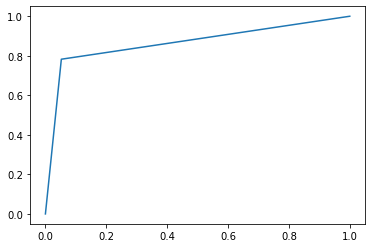

In [223]:
evaluate_model(y_test, rf_grid_search.predict(X_test))

In [224]:
make_submissions(rf_grid_search.predict(test_df,), 'rf_b.csv') 

#### Tuning Boosting

In [225]:
n_estimators

[50, 100, 150, 200, 500]

In [226]:
ada_param_grid = [{'n_estimators': [50,100,200,500],
                   'learning_rate': [0.1, 0.3, 0.5, 1]}]

In [227]:
ada_grid_search = GridSearchCV(estimator = AdaBoostClassifier(),
                              param_grid = ada_param_grid,
                               scoring = 'f1',
                               cv = 3,
                                verbose=1,
                                n_jobs= -1 )

In [228]:
ada_grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


GridSearchCV(cv=3, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid=[{'learning_rate': [0.1, 0.3, 0.5, 1],
                          'n_estimators': [50, 100, 200, 500]}],
             scoring='f1', verbose=1)

In [229]:
ada_grid_search.best_score_

0.6742920512694934

In [230]:
c.best_params_

{'learning_rate': 0.1, 'n_estimators': 500}

In [742]:
get_metrics(ada_grid_search.predict(X_train), ada_grid_search.predict(X_test),y_train, y_test ) # overfitting

auc_roc (train) -- 0.796253578983344
auc_roc (test) -- 0.8046832875603636
f1 (train) -- 0.677077308656256
f1 (test) -- 0.6851079954528231


 overall accuracy-- 0.9406428571428571
 overall f1-- 0.6851079954528231
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12574
           1       0.75      0.63      0.69      1426

    accuracy                           0.94     14000
   macro avg       0.85      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000

----------------confussion matrix----------------
[[12265   309]
 [  522   904]]
sensitivity -- 0.6339410939691444
specificity -- 0.9754254811515827
----------------roc curve----------------
 auc_roc-- 0.8046832875603636


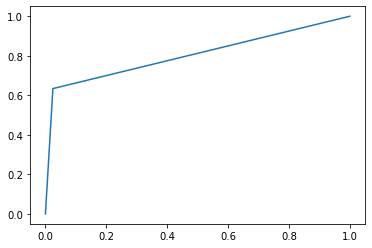

In [743]:
evaluate_model(y_test, ada_grid_search.predict(X_test))

In [232]:
make_submissions(ada_grid_search.predict(test_df,), 'ada_b.csv') 

In [236]:
n_estimators

[50, 100, 150, 200, 500]

In [242]:
n_estimators

[50, 100, 150, 200, 500]

In [374]:
xgb_param_grid_all = [{'learning_rate': learning_rates,
                    'max_depth': [3, 6, 10],
                    'min_child_weight': [1, 5],
                    'subsample': [1.0, 0.5, 0.2],
                    'n_estimators': [100, 250, 500],
                     'scale_pos_weight': [1, 9, 50, 100],
                      'reg_alpha': [1e-5, 0.1, 1, 100]}]

In [378]:
xgb_param_grid_1 = [{
                     'scale_pos_weight': [1, 9, 50, 100],
                      }]

In [379]:
xgb_grid_search_1 = GridSearchCV(estimator=XGBClassifier(n_jobs =-1),
        param_grid=xgb_param_grid_1,
        scoring='f1',
        cv=3,
        verbose=1,
        n_jobs= -1 )

In [380]:
xgb_grid_search_1.fit(X_train, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=-1,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=-1, param_grid=[{'scale_pos_weight': [1, 9, 50, 100]}],
             scoring='f1', verbose=1)

In [744]:
xgb_grid_search_1.best_score_

0.6873405848881053

In [383]:
xgb_grid_search_1.best_params_

{'scale_pos_weight': 9}

 overall accuracy-- 0.9282857142857143
 overall f1-- 0.6929663608562691
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.98      0.94      0.96     12574
           1       0.61      0.79      0.69      1426

    accuracy                           0.93     14000
   macro avg       0.80      0.87      0.83     14000
weighted avg       0.94      0.93      0.93     14000

----------------confussion matrix----------------
[[11863   711]
 [  293  1133]]
sensitivity -- 0.7945301542776999
specificity -- 0.9434547478924765
----------------roc curve----------------
 auc_roc-- 0.8689924510850882


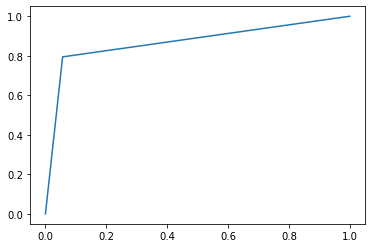

In [745]:
evaluate_model(y_test, xgb_grid_search_1.predict(X_test))

In [746]:
get_metrics(xgb_grid_search_1.predict(X_train), xgb_grid_search_1.predict(X_test),y_train, y_test ) # overfitting

auc_roc (train) -- 0.9791960837497871
auc_roc (test) -- 0.8689924510850882
f1 (train) -- 0.8511624429991776
f1 (test) -- 0.6929663608562691


In [384]:
make_submissions(xgb_grid_search_1.predict(test_df,), 'xg_n1.csv') 

#### We will continue our search for the best model for submission towards the end of this NB

### Feature importance

#### Feature importance from our best Random Forest model

In [247]:
rf_grid_search.best_params_

{'class_weight': 'balanced',
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 10,
 'min_samples_split': 10}

In [248]:
rf_best = RandomForestClassifier(class_weight = 'balanced',
                                 max_depth =  10,
                                 max_features =  'sqrt',
                                 min_samples_leaf =  10,
                                 min_samples_split =  10,
                                oob_score=True,
                                n_jobs=-1)

In [249]:
rf_best.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=10, min_samples_split=10, n_jobs=-1,
                       oob_score=True)

In [250]:
rf_best.oob_score_

0.9263379703208986

In [286]:
sorted_idx = rf.feature_importances_.argsort()[-10:]

In [287]:
list(zip(rf_best.feature_importances_[sorted_idx], X_train.columns[sorted_idx]))

[(0.018756405946993144, 'loc_og_t2t_mou_8'),
 (0.036343803801560375, 'loc_og_t2m_mou_8'),
 (0.05139841884081508, 'loc_ic_t2t_mou_8'),
 (0.0175531881587059, 'offnet_mou_8'),
 (0.05735709724801835, 'loc_og_mou_8'),
 (0.012010499467387515, 'arpu_8'),
 (0.03522821421251577, 'total_og_mou_8'),
 (0.06216247056300122, 'loc_ic_mou_8'),
 (0.05820014669934407, 'loc_ic_t2m_mou_8'),
 (0.08558124663816083, 'total_ic_mou_8')]

Text(0.5, 0, 'RF Feature Importance using MDI')

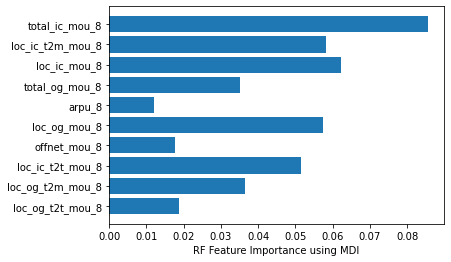

In [282]:
pyplot.barh(X_train.columns[sorted_idx], rf_best.feature_importances_[sorted_idx])
pyplot.xlabel("RF Feature Importance using MDI")

In [260]:
from sklearn.inspection import permutation_importance

In [261]:
perm_importance = permutation_importance(rf_best, X_test, y_test)

Text(0.5, 0, 'RF Feature importance using Permutation Importance')

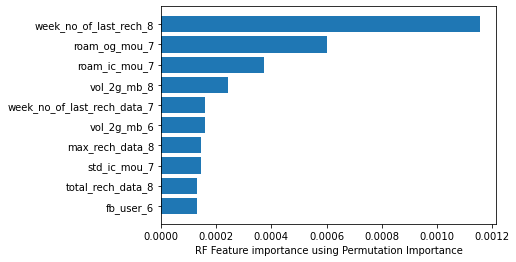

In [288]:
sorted_idx = perm_importance.importances_mean.argsort()[-10:]
pyplot.barh(X_test.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
pyplot.xlabel("RF Feature importance using Permutation Importance")

#### Feature importance from our best xgboost model (model trained in next section)

<AxesSubplot:>

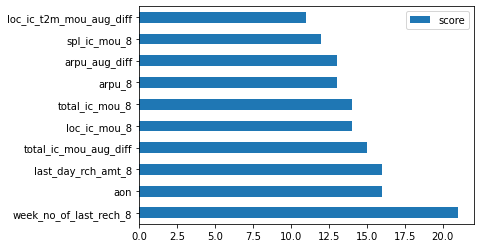

In [757]:
feature_important = xgb_fn_2.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(10, columns="score").plot(kind='barh', )

#### As we observe, most important features are the ones about final month usage/consumption
###### From the above analysis, we can say that the top 5 important features are:
- week_no_of_last_rech_8 (augmented feature)
- aon
- last_day_rch_amt_8
- tottal_ic_mou_aug_diff(augmented feature)
- loc_ic_mou_8

### Dimensionality reduction using PCA

In [289]:
from sklearn.decomposition import PCA


In [293]:
pca = PCA(random_state=10,n_components = 10)

In [294]:
pca.fit(X_train)

PCA(n_components=10, random_state=10)

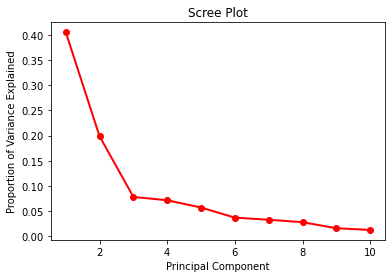

In [295]:
PC_values = np.arange(pca.n_components_) + 1
pyplot.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
pyplot.title('Scree Plot')
pyplot.xlabel('Principal Component')
pyplot.ylabel('Proportion of Variance Explained')
pyplot.show()

#### As we observe in the scree plot, roughly 95% of the total varaince is captured just by 3 components. So we'll use only those many components

In [296]:
pca = PCA(random_state=10,n_components = 3)

In [297]:
X_train_pca = pca.fit_transform(X_train)

In [301]:
pca_train_df = pd.DataFrame(X_train_pca, columns = ['PC1', 'PC2', 'PC3'])

In [313]:
pca_train_df_n = pd.concat([pca_train_df, y_train.reset_index()], axis = 1)

In [314]:
pca_train_df_n.head()

,PC1,PC2,PC3,index,churn_probability
0,-9.814807,-29.982326,-87.885155,39419,0
1,-12.525661,-1.451685,-24.181576,63398,0
2,7.103580,-12.375496,-39.058579,63925,0
3,1223.724430,183.786870,641.614594,68993,1
4,8.874835,-4.185886,-20.191804,35055,0


##### Component 1 v. 2

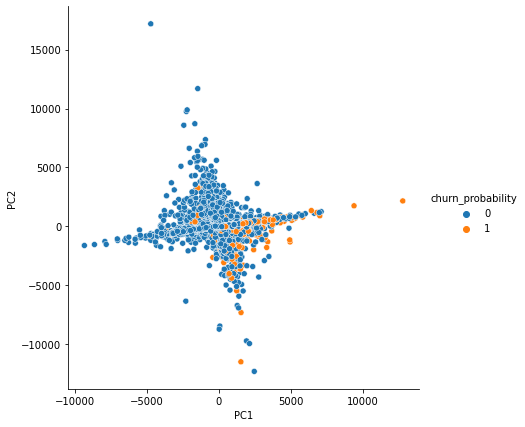

In [316]:
sns.pairplot(data=pca_train_df_n, x_vars = ['PC1'], y_vars=['PC2'], hue='churn_probability', size = 6)

##### Component 1 v. 3

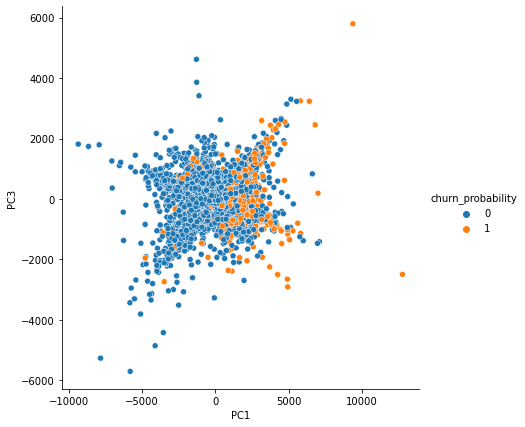

In [317]:
sns.pairplot(data=pca_train_df_n, x_vars = ['PC1'], y_vars=['PC3'], hue='churn_probability', size = 6)

##### Component 2 v. 3

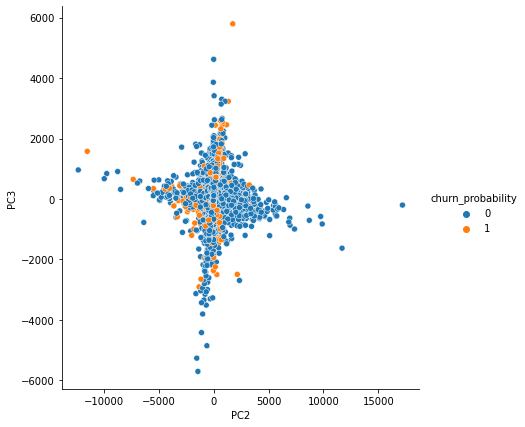

In [318]:
sns.pairplot(data=pca_train_df_n, x_vars = ['PC2'], y_vars=['PC3'], hue='churn_probability', size = 6)

In [319]:
X_test_pca = pca.transform(X_test)

In [320]:
test_df_pca = pca.transform(test_df)

#### Modelling with PCA transformed data

##### LR

In [337]:
lr_param_grid = [{'penalty': ['l1', 'l2'],
                   'C': param_range_fl,
                   'solver': ['saga'],
                    'class_weight': ['balanced']}]

In [338]:
lr_grid_search_pca = GridSearchCV(estimator=LogisticRegression(n_jobs=-1),
        param_grid=lr_param_grid,
        scoring='f1',
        cv=3,
        verbose=1,
        n_jobs= -1 )

In [339]:
lr_grid_search_pca.fit(X_train_pca, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3, estimator=LogisticRegression(n_jobs=-1), n_jobs=-1,
             param_grid=[{'C': [1.0, 0.8, 0.5, 0.1],
                          'class_weight': ['balanced'], 'penalty': ['l1', 'l2'],
                          'solver': ['saga']}],
             scoring='f1', verbose=1)

In [340]:
lr_grid_search_pca.best_params_

{'C': 1.0, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'saga'}

In [341]:
lr_grid_search_pca.best_score_

0.27774471638242293

 overall accuracy-- 0.5567142857142857
 overall f1-- 0.27786828019548526
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.97      0.52      0.68     12574
           1       0.17      0.84      0.28      1426

    accuracy                           0.56     14000
   macro avg       0.57      0.68      0.48     14000
weighted avg       0.88      0.56      0.64     14000

----------------confussion matrix----------------
[[6600 5974]
 [ 232 1194]]
sensitivity -- 0.8373071528751753
specificity -- 0.5248926355972642
----------------roc curve----------------
 auc_roc-- 0.6810998942362197


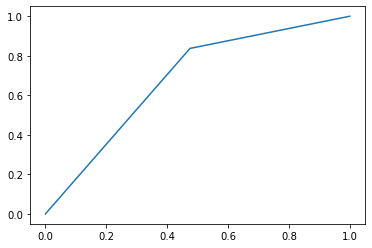

In [762]:
evaluate_model(y_test, lr_grid_search_pca.predict(X_test_pca))

In [761]:
get_metrics(lr_grid_search_pca.predict(X_train_pca), lr_grid_search_pca.predict(X_test_pca),y_train, y_test )

auc_roc (train) -- 0.6802365687021479
auc_roc (test) -- 0.6810998942362197
f1 (train) -- 0.27766106442577027
f1 (test) -- 0.27786828019548526


In [355]:
dt_param_grid_pca = [{'criterion': ['gini',],
                   'min_samples_leaf': min_leaf_size,
                   'max_depth': max_depth_range,
                   'min_samples_split': min_leaf_size,
                     'class_weight': class_weight}]

In [358]:
dt_grid_search_pca = GridSearchCV(estimator=DecisionTreeClassifier(),
        param_grid=dt_param_grid_pca,
        scoring='f1',
        cv=3,
        verbose=0,
        n_jobs= -1 )

In [359]:
dt_grid_search_pca.fit(X_train_pca, y_train)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid=[{'class_weight': [None, 'balanced'],
                          'criterion': ['gini'],
                          'max_depth': [5, 10, 20, 25, 50],
                          'min_samples_leaf': [5, 25, 50, 75, 100],
                          'min_samples_split': [5, 25, 50, 75, 100]}],
             scoring='f1')

In [362]:
dt_grid_search_pca.best_score_

0.3499345773490737

In [363]:
make_submissions(dt_grid_search_pca.predict(test_df_pca), 'dt_pca.csv' )

In [360]:
rf_param_grid_pca = [{'min_samples_leaf': [10,50],
                   'min_samples_split': [10, 25],
                  'max_features': ['sqrt', 'log2',],
                     'class_weight': class_weight}]

In [361]:
rf_grid_search = GridSearchCV(estimator=RandomForestClassifier(n_jobs=-1, oob_score=True),
        param_grid=rf_param_grid_pca,
        scoring='f1',
        cv=3,
        verbose=1,
        n_jobs= -1 )

In [364]:
ada_param_grid_pca = [{'n_estimators': [50,100,200,500],
                   'learning_rate': [0.1, 0.3, 0.5, 1]}]

In [365]:
ada_grid_search_pca = GridSearchCV(estimator = AdaBoostClassifier(),
                              param_grid = ada_param_grid_pca,
                               scoring = 'f1',
                               cv = 3,
                                verbose=1,
                                n_jobs= -1 )

In [366]:
ada_grid_search_pca.fit(X_train_pca, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


GridSearchCV(cv=3, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid=[{'learning_rate': [0.1, 0.3, 0.5, 1],
                          'n_estimators': [50, 100, 200, 500]}],
             scoring='f1', verbose=1)

In [367]:
ada_grid_search_pca.best_score_

0.029612592666718205

In [760]:
get_metrics(ada_grid_search_pca.predict(X_train_pca), ada_grid_search_pca.predict(X_test_pca),y_train, y_test )

auc_roc (train) -- 0.509327783980825
auc_roc (test) -- 0.5062498452359786
f1 (train) -- 0.03955375253549696
f1 (test) -- 0.02847457627118644


#### We observe that the results are not very impressive using PCA

### Conclusion/ Recommendations
- Given our analysis, we observed that most users show early signs of churning before actually churning, often towards the last months. The telecom companies should regularly monitor users' recent usage and compare it with usage in the previous months to notice these signs. As shown earlier, some of the most important signs are:
    - week_no_of_last_rech_8 (augmented feature)
    - aon
    - last_day_rch_amt_8
    - tottal_ic_mou_aug_diff(augmented feature)
    - loc_ic_mou_8
- These are only the top features, amongst others. 
- Once the users' highly likely to churn have been identified either by observing these features or by infering thier usage data through the model we built, they should be targetted and offered incentives.
- It would also be valuable to connect with such users to understand their grievences, if any and then work on them in a hope to retain the users

### Fine tuning for best models (For submissions)

In [385]:
xgb_param_grid_2 = [{
                     'n_estimators': [100,500,1000],
                      }]

In [386]:
xgb_grid_search_2 = GridSearchCV(estimator=XGBClassifier(n_jobs =-1, scale_pos_weight = 9),
        param_grid=xgb_param_grid_2,
        scoring='f1',
        cv=3,
        verbose=1,
        n_jobs= -1 )

In [387]:
xgb_grid_search_2.fit(X_train, y_train)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=-1,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=-1, param_grid=[{'n_estimators': [100, 500, 1000]}],
             scoring='f1', verbose=1)

In [393]:
xgb_grid_search_2.best_score_ # max_depth = 6 (default)

0.6925622000061882

In [748]:
get_metrics(xgb_grid_search_2.predict(X_train), xgb_grid_search_2.predict(X_test),y_train, y_test ) #overfitting

auc_roc (train) -- 0.9998906408446503
auc_roc (test) -- 0.8258799910142057
f1 (train) -- 0.9990370305523943
f1 (test) -- 0.695683196575098


In [389]:
xgb_grid_search_2.best_params_

{'n_estimators': 500}

In [390]:
make_submissions(xgb_grid_search_2.predict(test_df,), 'xg_n2.csv') 

In [394]:
xgb_param_grid_3 = [{
                     'max_depth': [4, 8, 10],
                      }]

In [395]:
xgb_grid_search_3 = GridSearchCV(estimator=XGBClassifier(n_jobs =-1, scale_pos_weight = 9, n_estimators = 500),
        param_grid=xgb_param_grid_3,
        scoring='f1',
        cv=3,
        verbose=3,
        n_jobs= -1 )

In [396]:
xgb_grid_search_3.fit(X_train, y_train)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
[CV 2/3] END .......................max_depth=4;, score=0.693 total time=11.2min
[CV 3/3] END .......................max_depth=8;, score=0.684 total time=21.1min
[CV 1/3] END .......................max_depth=4;, score=0.696 total time=11.2min
[CV 1/3] END ......................max_depth=10;, score=0.701 total time=22.9min
[CV 1/3] END .......................max_depth=8;, score=0.700 total time=20.7min
[CV 2/3] END ......................max_depth=10;, score=0.699 total time=19.7min
[CV 3/3] END .......................max_depth=4;, score=0.680 total time=11.2min
[CV 2/3] END .......................max_depth=8;, score=0.697 total time=21.0min
[CV 3/3] END ......................max_depth=10;, score=0.686 total time=13.6min


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=500, n_jobs=-1,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=-1, param_grid=[{'max_depth': [4, 8, 10]}], scoring='f1',
             verbose=3)

In [397]:
xgb_grid_search_3.best_score_

0.6949767707178403

In [398]:
xgb_grid_search_3.best_params_

{'max_depth': 10}

In [749]:
get_metrics(xgb_grid_search_3.predict(X_train), xgb_grid_search_3.predict(X_test),y_train, y_test ) #overfitting

auc_roc (train) -- 1.0
auc_roc (test) -- 0.8199880271206799
f1 (train) -- 1.0
f1 (test) -- 0.6950819672131147


In [399]:
make_submissions(xgb_grid_search_3.predict(test_df,), 'xg_n3.csv') 

In [400]:
xgb_4 = XGBClassifier(n_jobs =-1, scale_pos_weight = 9, n_estimators = 500, max_depth = 10, min_child_weight = 3)


In [401]:
xgb_4.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=10, max_leaves=0, min_child_weight=3,
              missing=nan, monotone_constraints='()', n_estimators=500,
              n_jobs=-1, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [508]:
make_submissions(xgb_4.predict(test_df), 'xgboost_new_4_overfit.csv')

In [750]:
get_metrics(xgb_4.predict(X_train), xgb_4.predict(X_test),y_train, y_test ) #overfitting

auc_roc (train) -- 1.0
auc_roc (test) -- 0.8323178954502389
f1 (train) -- 1.0
f1 (test) -- 0.7065527065527065


In [492]:
xgb_fn = XGBClassifier(max_depth = 3)

In [493]:
xgb_fn.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [500]:
get_metrics(xgb_fn.predict(X_train), xgb_fn.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8293745113501686
auc_roc (test) -- 0.8178554625620534
f1 (train) -- 0.7307873644507308
f1 (test) -- 0.7046050168476227


In [496]:
make_submissions(xgb_fn.predict(test_df), 'xgboost_new_.csv')

In [454]:
xgb_fn_1 = XGBClassifier(max_depth = 3, subsample = 0.8)

In [455]:
xgb_fn_1.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [466]:
get_metrics(xgb_fn_1.predict(X_train), xgb_fn_1.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8334414258139555
auc_roc (test) -- 0.8175445960196145
f1 (train) -- 0.7355395143901753
f1 (test) -- 0.704383664293743


In [458]:
xgb_fn_2 = XGBClassifier(max_depth = 3, subsample = 0.8, scale_pos_weight = 9)

In [459]:
xgb_fn_2.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [467]:
get_metrics(xgb_fn_2.predict(X_train), xgb_fn_2.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.9143458728974044
auc_roc (test) -- 0.8889485326809189
f1 (train) -- 0.6793383068439831
f1 (test) -- 0.6517504606475388


In [468]:
xgb_fn_smote = XGBClassifier(max_depth = 3)

In [113]:
sm_def = SMOTENC(random_state=10, sampling_strategy=  1.0, categorical_features = cat_indexes)
x_train_sm1, y_train_sm1 = sm_def.fit_resample(X_train, y_train)

In [ ]:
xgb_fn_smote.fit(x_train_sm1, y_train_sm1)

In [472]:
x_test_sm1, y_test_sm1 = sm_def.fit_resample(X_test, y_test)

In [473]:
get_metrics(xgb_fn_smote.predict(x_train_sm1), xgb_fn_smote.predict(x_test_sm1),y_train_sm1, y_test_sm1 )

auc_roc (train) -- 0.9640407213727556
auc_roc (test) -- 0.9618657547319867
f1 (train) -- 0.9639579492800558
f1 (test) -- 0.9617730298561008


In [480]:
get_metrics(xgb_fn_smote.predict(x_train_sm1), xgb_fn_smote.predict(X_test),y_train_sm1, y_test )

auc_roc (train) -- 0.9640407213727556
auc_roc (test) -- 0.8331274646518976
f1 (train) -- 0.9639579492800558
f1 (test) -- 0.6961057023643951


In [474]:
xgb_fn_smote1 = XGBClassifier(max_depth = 3)

In [475]:
sm_def2 = SMOTENC(random_state=10, sampling_strategy=  0.5, categorical_features = cat_indexes)
x_train_sm2, y_train_sm2 = sm_def2.fit_resample(X_train, y_train)

In [476]:
xgb_fn_smote1.fit(x_train_sm2, y_train_sm2)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [477]:
x_test_sm2, y_test_sm2 = sm_def2.fit_resample(X_test, y_test)

In [478]:
get_metrics(xgb_fn_smote1.predict(x_train_sm2), xgb_fn_smote1.predict(x_test_sm2),y_train_sm2, y_test_sm2 )

auc_roc (train) -- 0.9460553299555957
auc_roc (test) -- 0.9431763957372356
f1 (train) -- 0.9307089777063667
f1 (test) -- 0.926445816956766


In [481]:
get_metrics(xgb_fn_smote1.predict(x_train_sm2), xgb_fn_smote1.predict(X_test),y_train_sm2, y_test )

auc_roc (train) -- 0.9460553299555957
auc_roc (test) -- 0.8341758444984653
f1 (train) -- 0.9307089777063667
f1 (test) -- 0.7060070671378093


In [479]:
metrics.accuracy_score(y_test,xgb_fn_smote1.predict(X_test))

0.9405714285714286

In [484]:
xgb_fn_smote2 = XGBClassifier(max_depth = 3)

In [483]:
sm_def3 = SMOTENC(random_state=10, sampling_strategy=  0.3, categorical_features = cat_indexes)
x_train_sm3, y_train_sm3 = sm_def3.fit_resample(X_train, y_train)

In [485]:
xgb_fn_smote2.fit(x_train_sm3, y_train_sm3)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [486]:
x_test_sm3, y_test_sm3 = sm_def3.fit_resample(X_test, y_test)

In [487]:
get_metrics(xgb_fn_smote2.predict(x_train_sm3), xgb_fn_smote2.predict(x_test_sm3),y_train_sm3, y_test_sm3 )

auc_roc (train) -- 0.9206377959946258
auc_roc (test) -- 0.9169811850641657
f1 (train) -- 0.8861923271928343
f1 (test) -- 0.8795359503574801


In [488]:
get_metrics(xgb_fn_smote2.predict(x_train_sm3), xgb_fn_smote2.predict(X_test),y_train_sm3, y_test )

auc_roc (train) -- 0.9206377959946258
auc_roc (test) -- 0.8326757767926917
f1 (train) -- 0.8861923271928343
f1 (test) -- 0.7088245802072168


In [490]:
make_submissions(xgb_fn_smote2.predict(test_df), 'xgboost_new_smote0.5.csv')

In [497]:
xgb_fn_3 = XGBClassifier(max_depth = 3, scale_pos_weight = 9)

In [498]:
xgb_fn_3.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [499]:
get_metrics(c.predict(X_train), xgb_fn_3.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.9139972132737838
auc_roc (test) -- 0.8897473381146027
f1 (train) -- 0.6793065385364586
f1 (test) -- 0.6494252873563219


 overall accuracy-- 0.9041428571428571
 overall f1-- 0.6494252873563219
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.98      0.91      0.94     12574
           1       0.52      0.87      0.65      1426

    accuracy                           0.90     14000
   macro avg       0.75      0.89      0.80     14000
weighted avg       0.94      0.90      0.91     14000

----------------confussion matrix----------------
[[11415  1159]
 [  183  1243]]
sensitivity -- 0.8716690042075736
specificity -- 0.9078256720216319
----------------roc curve----------------
 auc_roc-- 0.8897473381146027


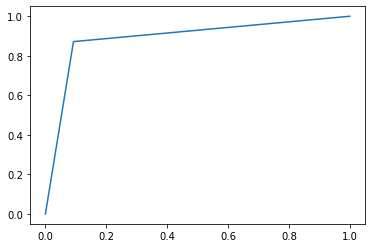

In [752]:
evaluate_model(y_test, xgb_fn_3.predict(X_test))

In [501]:
make_submissions(xgb_fn_3.predict(test_df), 'xgboost_new_weight.csv')

In [556]:
xgb_fn_1_new = XGBClassifier(max_depth = 3,n_jobs = -1)

In [557]:
[i/10.0 for i in range(0,5)]

[0.0, 0.1, 0.2, 0.3, 0.4]

In [558]:
xgb_fn_1_new_param_grid = [{'gamma': [i/10.0 for i in range(0,5)]}]

In [559]:
xgb_fn_1_new_grid = GridSearchCV(estimator = xgb_fn_1_new,
                              param_grid = xgb_fn_1_new_param_grid,
                               scoring = 'accuracy',
                               cv = 3,
                                verbose=4,
                                n_jobs= -1, return_train_score=True )

In [455]:
xgb_fn_1_new_grid.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

#### LR

In [510]:
clf2 = LogisticRegressionCV(cv=5, random_state=1, scoring = 'f1', max_iter=500).fit(X_train, y_train)


In [512]:
get_metrics(clf2.predict(X_train), clf2.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.6600917257886662
auc_roc (test) -- 0.6600066456507351
f1 (train) -- 0.45465309022022254
f1 (test) -- 0.45632458233890216


In [511]:
clf

{1: array([[0.28611698, 0.40844196, 0.44086022, 0.45744065, 0.4490277 ,
         0.45653459, 0.45727755, 0.45990566, 0.46226415, 0.46162928],
        [0.31890034, 0.42689698, 0.45572609, 0.46162859, 0.46604215,
         0.46144791, 0.46674446, 0.45872642, 0.46208113, 0.46054181],
        [0.34051144, 0.42319556, 0.44337927, 0.45876887, 0.44760213,
         0.45650905, 0.45862884, 0.46252927, 0.45936396, 0.4608132 ],
        [0.28511822, 0.39179104, 0.4182145 , 0.42467378, 0.4361949 ,
         0.42764324, 0.43447462, 0.43262411, 0.43195266, 0.43627742],
        [0.31391364, 0.38742138, 0.42925659, 0.42522523, 0.43705463,
         0.42934456, 0.43608124, 0.43592814, 0.43243243, 0.43149038]])}

### ADA 

In [517]:
ada_param_grid_new = [{'n_estimators': [400,500, 700, 600],
                   'learning_rate': [0.05,0.01, 0.1, 0.3, 0.5,]}]

In [518]:
ada_grid_search_new = GridSearchCV(estimator = AdaBoostClassifier(random_state=10),
                              param_grid = ada_param_grid,
                               scoring = 'accuracy',
                               cv = 3,
                                verbose=4,
                                n_jobs= -1, return_train_score=True )

In [519]:
ada_grid_search_new.fit(X_train, y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV 1/3] END learning_rate=0.05, n_estimators=400;, score=(train=0.674, test=0.671) total time= 5.0min
[CV 1/3] END learning_rate=0.05, n_estimators=700;, score=(train=0.677, test=0.676) total time= 9.5min
[CV 2/3] END learning_rate=0.05, n_estimators=600;, score=(train=0.665, test=0.682) total time= 8.1min
[CV 3/3] END learning_rate=0.01, n_estimators=400;, score=(train=0.651, test=0.629) total time= 5.9min
[CV 1/3] END learning_rate=0.01, n_estimators=700;, score=(train=0.655, test=0.662) total time= 9.6min
[CV 2/3] END learning_rate=0.01, n_estimators=600;, score=(train=0.643, test=0.653) total time= 8.5min
[CV 3/3] END learning_rate=0.1, n_estimators=400;, score=(train=0.684, test=0.659) total time= 5.4min
[CV 1/3] END learning_rate=0.1, n_estimators=700;, score=(train=0.679, test=0.679) total time= 9.6min
[CV 2/3] END learning_rate=0.1, n_estimators=600;, score=(train=0.669, test=0.686) total time= 8.2min
[CV 2/3] END le

GridSearchCV(cv=3, estimator=AdaBoostClassifier(random_state=10), n_jobs=-1,
             param_grid=[{'learning_rate': [0.05, 0.01, 0.1, 0.3, 0.5],
                          'n_estimators': [400, 500, 700, 600]}],
             return_train_score=True, scoring='f1', verbose=4)

In [525]:
ada_grid_search_new.best_score_

0.6751183555234924

In [526]:
ada_grid_search_new.best_params_

{'learning_rate': 0.3, 'n_estimators': 400}

In [530]:
ada_grid_search.best_params_

{'learning_rate': 0.1, 'n_estimators': 500}

In [529]:
get_metrics(ada_grid_search_new.predict(X_train), ada_grid_search_new.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.7989924485905514
auc_roc (test) -- 0.8035518649650172
f1 (train) -- 0.6793717678605631
f1 (test) -- 0.6830932524639879


In [533]:
class_weight

[None, 'balanced']

In [536]:
lr_param_grid_new = [{'penalty': ['l1', 'l2', None],
                   'C': [0.1, 1, 10, 20, 50],
                    'class_weight': class_weight}]

In [543]:
lr_grid_new = GridSearchCV(estimator = LogisticRegression(random_state=10, solver='saga', max_iter=750),
                              param_grid = lr_param_grid_new,
                               scoring = 'accuracy',
                               cv = 3,
                                verbose=4,
                                n_jobs= -1, return_train_score=True )

In [544]:
lr_grid_new.fit(X_train, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rishabh/opt/miniconda3/envs/py39new/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

GridSearchCV(cv=3,
             estimator=LogisticRegression(max_iter=750, random_state=10,
                                          solver='saga'),
             n_jobs=-1,
             param_grid=[{'C': [0.1, 1, 10, 20, 50],
                          'class_weight': [None, 'balanced'],
                          'penalty': ['l1', 'l2', None]}],
             return_train_score=True, scoring='accuracy', verbose=4)

[CV 1/3] END C=0.1, class_weight=None, penalty=l2;, score=(train=0.904, test=0.904) total time= 3.6min
[CV 2/3] END C=0.1, class_weight=None, penalty=l2;, score=(train=0.902, test=0.904) total time= 2.7min
[CV 3/3] END C=0.1, class_weight=balanced, penalty=l1;, score=(train=0.780, test=0.783) total time= 3.3min
[CV 2/3] END C=1, class_weight=None, penalty=l1;, score=(train=0.902, test=0.904) total time= 3.3min
[CV 3/3] END C=1, class_weight=None, penalty=l2;, score=(train=0.904, test=0.902) total time= 2.7min
[CV 1/3] END C=1, class_weight=balanced, penalty=l2;, score=(train=0.794, test=0.791) total time= 3.1min
[CV 1/3] END C=1, class_weight=balanced, penalty=None;, score=(train=nan, test=nan) total time=   0.1s
[CV 2/3] END C=1, class_weight=balanced, penalty=None;, score=(train=nan, test=nan) total time=   0.2s
[CV 3/3] END C=1, class_weight=balanced, penalty=None;, score=(train=nan, test=nan) total time=   0.2s
[CV 1/3] END C=10, class_weight=None, penalty=l1;, score=(train=0.904, 

In [545]:
lr_grid_new.best_score_


0.9033196918716149

In [546]:
lr_grid_new.best_params_

{'C': 0.1, 'class_weight': None, 'penalty': 'l1'}

In [547]:
lr_grid_new.best_params_

{'C': 0.1, 'class_weight': None, 'penalty': 'l1'}

In [549]:
get_metrics(lr_grid_new.predict(X_train), lr_grid_new.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.5557680729097834
auc_roc (test) -- 0.5581322665193722
f1 (train) -- 0.20086296682041363
f1 (test) -- 0.20803782505910162


In [550]:
make_submissions(lr_grid_new.predict(test_df), 'lr_gn_new.csv')

In [552]:
lr_tuned = LogisticRegression(random_state=10, solver='saga', max_iter=750, penalty = 'l1', C = 0.1).fit(X_train, y_train)


In [553]:
get_metrics(lr_tuned.predict(X_train), lr_tuned.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.5557680729097834
auc_roc (test) -- 0.5581322665193722
f1 (train) -- 0.20086296682041363
f1 (test) -- 0.20803782505910162


### xgb fresh

In [560]:
X_train_xgb = X_train.copy()
X_test_xgb = X_test.copy()
test_df_xgb = test_df.copy()

In [564]:
cat_feat_new[1:]

Index(['night_pck_user_8', 'night_pck_user_7', 'night_pck_user_6', 'fb_user_7',
       'fb_user_8', 'fb_user_6', 'monthly_2g_6', 'week_no_of_last_rech_data_6',
       'week_no_of_last_rech_8', 'week_no_of_last_rech_7',
       'week_no_of_last_rech_6', 'week_no_of_last_rech_data_7',
       'week_no_of_last_rech_data_8', 'monthly_2g_7', 'monthly_2g_8',
       'monthly_3g_6', 'monthly_3g_8'],
      dtype='object')

In [566]:
X_train_xgb[cat_feat_new[1:]] = X_train_xgb[cat_feat_new[1:]].astype('category')
X_test_xgb[cat_feat_new[1:]] = X_test_xgb[cat_feat_new[1:]].astype('category')
test_df_xgb[cat_feat_new[1:]] = test_df_xgb[cat_feat_new[1:]].astype('category')

In [574]:
base_xgb = XGBClassifier(n_jobs = 4,)

In [575]:
base_xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [576]:
get_metrics(base_xgb.predict(X_train), base_xgb.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.9375829981210214
auc_roc (test) -- 0.8096716526522038
f1 (train) -- 0.9000267546597699
f1 (test) -- 0.6925688419464353


In [577]:
base_xgb_1 = XGBClassifier(n_jobs = 4,max_depth = 3)

In [578]:
base_xgb_1.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [579]:
get_metrics(base_xgb_1.predict(X_train), base_xgb_1.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8293745113501686
auc_roc (test) -- 0.8178554625620534
f1 (train) -- 0.7307873644507308
f1 (test) -- 0.7046050168476227


In [580]:
base_xgb_2 = XGBClassifier(n_jobs = 4,max_depth = 4)

In [581]:
base_xgb_2.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=4, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [582]:
get_metrics(base_xgb_2.predict(X_train), base_xgb_2.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8555971854215754
auc_roc (test) -- 0.8182458582917042
f1 (train) -- 0.7718842729970326
f1 (test) -- 0.7053538000748784


In [589]:
base_xgb_3 = XGBClassifier(n_jobs = 4,max_depth = 3, min_child_weight = 0.1)

In [590]:
base_xgb_3.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=0.1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [591]:
get_metrics(base_xgb_3.predict(X_train), base_xgb_3.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8303844204820948
auc_roc (test) -- 0.8209388638056535
f1 (train) -- 0.7314457717994544
f1 (test) -- 0.7103293413173652


In [592]:
[i/10.0 for i in range(0,5)]

[0.0, 0.1, 0.2, 0.3, 0.4]

In [593]:
xgb_new_grid = {'gamma': [i/10.0 for i in range(0,5)]}

In [594]:
base_xgb_3_grid = GridSearchCV(estimator = base_xgb_3,
                              param_grid = xgb_new_grid,
                               scoring = 'f1',
                               cv = 3,
                                verbose=4,
                                n_jobs= -1, return_train_score=True )

In [595]:
base_xgb_3_grid.fit(X_train, y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     callbacks=None, colsample_bylevel=1,
                                     colsample_bynode=1, colsample_bytree=1,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=0, gpu_id=-1,
                                     grow_policy='depthwise',
                                     importance_type=None,
                                     interaction_constraints='',
                                     learning_rate=0.300000012, max_bin=256,
                                     max_cat_to_onehot=4, max_delta_step=0,
                                     max_depth=3, max_leaves=0,
                                     min_child_weight=0.1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=4,
                                     num_parallel_tree=1, predictor='auto',
                                     random_state=0, reg_alpha=0, reg_lambda=1, ...),
             n_jobs=-1, param_grid={'gamma': [0.0, 0.1, 0.2, 0.3, 0.4]},
             return_train_score=True, scoring='f1', verbose=4)

In [596]:
base_xgb_3_grid.best_score_

0.6894684666396618

In [597]:
base_xgb_3_grid.cv_results_

{'mean_fit_time': array([78.83900905, 77.96247975, 78.46006139, 81.5496513 , 65.24370591]),
 'std_fit_time': array([0.21421245, 0.80927505, 2.02346949, 0.09480758, 0.13402833]),
 'mean_score_time': array([0.46732402, 0.75298627, 0.73594507, 0.43399819, 0.27604262]),
 'std_score_time': array([0.02421864, 0.23002963, 0.16409011, 0.05769902, 0.01176752]),
 'param_gamma': masked_array(data=[0.0, 0.1, 0.2, 0.3, 0.4],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'gamma': 0.0},
  {'gamma': 0.1},
  {'gamma': 0.2},
  {'gamma': 0.3},
  {'gamma': 0.4}],
 'split0_test_score': array([0.69252548, 0.6921552 , 0.6921552 , 0.6921552 , 0.6917847 ]),
 'split1_test_score': array([0.69614512, 0.6953548 , 0.6953548 , 0.6953548 , 0.6953548 ]),
 'split2_test_score': array([0.67973479, 0.67973479, 0.67973479, 0.67973479, 0.67973479]),
 'mean_test_score': array([0.68946847, 0.6890816 , 0.6890816 , 0.6890816 , 0.6889581 ]),
 'std_test_sc

In [598]:
base_xgb_3_grid.best_params_

{'gamma': 0.0}

[CV 3/3] END .....gamma=0.0;, score=(train=0.754, test=0.680) total time= 1.3min
[CV 2/3] END .....gamma=0.1;, score=(train=0.746, test=0.695) total time= 1.3min
[CV 3/3] END .....gamma=0.3;, score=(train=0.754, test=0.680) total time= 1.4min
[CV 1/3] END .....gamma=0.1;, score=(train=0.748, test=0.692) total time= 1.3min
[CV 1/3] END .....gamma=0.2;, score=(train=0.748, test=0.692) total time= 1.3min
[CV 3/3] END .....gamma=0.2;, score=(train=0.754, test=0.680) total time= 1.4min
[CV 1/3] END .....gamma=0.4;, score=(train=0.749, test=0.692) total time= 1.1min
[CV 2/3] END .....gamma=0.0;, score=(train=0.744, test=0.696) total time= 1.3min
[CV 3/3] END .....gamma=0.1;, score=(train=0.754, test=0.680) total time= 1.3min
[CV 2/3] END .....gamma=0.3;, score=(train=0.746, test=0.695) total time= 1.4min
[CV 2/3] END .....gamma=0.4;, score=(train=0.746, test=0.695) total time= 1.1min
[CV 1/3] END .....gamma=0.0;, score=(train=0.748, test=0.693) total time= 1.3min
[CV 2/3] END .....gamma=0.2;

In [629]:
base_xgb_4 = XGBClassifier(n_jobs = 4,max_depth = 3, min_child_weight = 0.1, subsample = 0.8)

In [630]:
base_xgb_4.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=0.1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [631]:
get_metrics(base_xgb_4.predict(X_train), base_xgb_4.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8314322479662797
auc_roc (test) -- 0.8221823299754095
f1 (train) -- 0.7318765825752602
f1 (test) -- 0.7111940298507462


In [ ]:
make_submissions(base_xgb_4.predict(test_df), 'base_xgb_4.csv')

In [606]:
base_xgb_5 = XGBClassifier(n_jobs = 4,max_depth = 3, min_child_weight = 0.1, subsample = 0.8, colsample_bytree = 0.8)



In [607]:
base_xgb_5.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=0.1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [608]:
get_metrics(base_xgb_5.predict(X_train), base_xgb_5.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.833261775794057
auc_roc (test) -- 0.8118947332492904
f1 (train) -- 0.7367431365174878
f1 (test) -- 0.6963074604370761


In [617]:
base_xgb_6 = XGBClassifier(n_jobs = 4,max_depth = 3, min_child_weight = 0.1, subsample = 0.8, reg_lambda  =0.8)

In [618]:
base_xgb_6.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=0.1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=0.8, ...)

In [619]:
get_metrics(base_xgb_6.predict(X_train), base_xgb_6.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8334476703287051
auc_roc (test) -- 0.8175048314260086
f1 (train) -- 0.7346060265768296
f1 (test) -- 0.704119850187266


In [620]:
base_xgb_4 = XGBClassifier(n_jobs = 4,max_depth = 3, min_child_weight = 0.1, subsample = 0.8)

In [623]:
base_xgb_grid_4 = {'n_estimators': [100,300,500,700,1000]}

In [624]:
base_xgb_4_grid = GridSearchCV(estimator = base_xgb_4,
                              param_grid = base_xgb_grid_4,
                               scoring = 'f1',
                               cv = 3,
                                verbose=4,
                                n_jobs= -1, return_train_score=True )

In [625]:
base_xgb_4_grid.fit(X_train, y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV 1/3] END n_estimators=300;, score=(train=0.849, test=0.684) total time= 4.7min
[CV 2/3] END n_estimators=500;, score=(train=0.922, test=0.687) total time= 8.3min
[CV 3/3] END n_estimators=700;, score=(train=0.969, test=0.663) total time=11.8min


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=0.1,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=4,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=-1, param_grid={'n_estimators': [100, 300, 500, 700, 1000]},
             return_train_score=True, scoring='f1', verbose=4)

[CV 1/3] END n_estimators=100;, score=(train=0.750, test=0.693) total time= 1.7min
[CV 2/3] END n_estimators=300;, score=(train=0.849, test=0.694) total time= 4.6min
[CV 3/3] END n_estimators=500;, score=(train=0.920, test=0.666) total time= 8.4min
[CV 1/3] END n_estimators=1000;, score=(train=0.994, test=0.663) total time=15.6min
[CV 3/3] END n_estimators=100;, score=(train=0.752, test=0.677) total time= 1.7min
[CV 3/3] END n_estimators=300;, score=(train=0.848, test=0.675) total time= 4.6min
[CV 1/3] END n_estimators=700;, score=(train=0.969, test=0.666) total time=11.8min
[CV 2/3] END n_estimators=1000;, score=(train=0.993, test=0.674) total time=13.9min
[CV 2/3] END n_estimators=100;, score=(train=0.749, test=0.697) total time= 1.7min
[CV 1/3] END n_estimators=500;, score=(train=0.925, test=0.670) total time= 8.0min
[CV 2/3] END n_estimators=700;, score=(train=0.965, test=0.675) total time=11.6min
[CV 3/3] END n_estimators=1000;, score=(train=0.996, test=0.663) total time=11.5min


In [626]:
base_xgb_4_grid.best_score_ 

0.6890377749719617

In [627]:
base_xgb_4_grid.best_params_ 

{'n_estimators': 100}

In [634]:
base_xgb_5_n = XGBClassifier(n_jobs = 4,max_depth = 3, min_child_weight = 0.1, subsample = 0.8)

In [644]:
base_xgb_grid_5 = {'n_estimators': [100,200, 300],
                  'reg_alpha' : [0,0.001, 0.1, 0.3]}

In [637]:
base_xgb_5_grid = GridSearchCV(estimator = base_xgb_5_n,
                              param_grid = base_xgb_grid_5,
                               scoring = 'f1',
                               cv = 3,
                                verbose=4,
                                n_jobs= 4, return_train_score=True )

In [638]:
base_xgb_5_grid.fit(X_train, y_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_ca...
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=0.1,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=4,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=4,
             param_grid={'n_estimators': [100, 200, 300],
                         'reg_alpha': [0.001, 0.005, 0.1, 0.3]},
             return_train_score=True, scoring='f1', verbose=4)

In [639]:
base_xgb_5_grid.best_score_

0.6933204846385137

In [640]:
base_xgb_5_grid.best_params_

{'n_estimators': 100, 'reg_alpha': 0.3}

In [641]:
base_xgb_5_grid.cv_results_

[CV 1/3] END n_estimators=100, reg_alpha=0.005;, score=(train=0.752, test=0.693) total time= 1.6min
[CV 2/3] END n_estimators=100, reg_alpha=0.005;, score=(train=0.752, test=0.693) total time= 1.4min
[CV 3/3] END n_estimators=100, reg_alpha=0.1;, score=(train=0.754, test=0.682) total time= 1.4min
[CV 2/3] END n_estimators=200, reg_alpha=0.001;, score=(train=0.802, test=0.686) total time= 2.6min
[CV 3/3] END n_estimators=200, reg_alpha=0.005;, score=(train=0.799, test=0.678) total time= 2.7min
[CV 1/3] END n_estimators=200, reg_alpha=0.3;, score=(train=0.803, test=0.685) total time= 3.0min
[CV 2/3] END n_estimators=300, reg_alpha=0.001;, score=(train=0.848, test=0.683) total time= 4.1min
[CV 3/3] END n_estimators=300, reg_alpha=0.005;, score=(train=0.847, test=0.670) total time= 4.1min
[CV 1/3] END n_estimators=300, reg_alpha=0.3;, score=(train=0.851, test=0.675) total time= 4.3min


{'mean_fit_time': array([ 94.77411739,  88.46903507,  84.40085355,  81.50339127,
        158.28689822, 161.19130842, 167.73552155, 176.96254659,
        245.27240872, 245.39597797, 249.30841541, 254.74868107]),
 'std_fit_time': array([0.06982788, 4.38716965, 1.93801697, 0.33728509, 0.30180088,
        1.58651627, 6.03131628, 0.41762111, 0.06898874, 0.29193559,
        3.19373298, 0.51606161]),
 'mean_score_time': array([0.6126372 , 0.63506953, 0.54947702, 0.48991537, 0.60566433,
        0.48937599, 0.67933512, 0.63059704, 0.65980132, 0.55985697,
        0.5550499 , 0.46633673]),
 'std_score_time': array([0.02788566, 0.02616613, 0.08370044, 0.01036843, 0.04329448,
        0.14569059, 0.1759313 , 0.14847098, 0.06346858, 0.04471856,
        0.16292969, 0.13698122]),
 'param_n_estimators': masked_array(data=[100, 100, 100, 100, 200, 200, 200, 200, 300, 300, 300,
                    300],
              mask=[False, False, False, False, False, False, False, False,
                    False, 

[CV 1/3] END n_estimators=100, reg_alpha=0.001;, score=(train=0.750, test=0.693) total time= 1.6min
[CV 3/3] END n_estimators=100, reg_alpha=0.005;, score=(train=0.753, test=0.679) total time= 1.4min
[CV 1/3] END n_estimators=100, reg_alpha=0.3;, score=(train=0.747, test=0.694) total time= 1.4min
[CV 1/3] END n_estimators=200, reg_alpha=0.001;, score=(train=0.808, test=0.685) total time= 2.7min
[CV 1/3] END n_estimators=200, reg_alpha=0.1;, score=(train=0.807, test=0.683) total time= 2.7min
[CV 2/3] END n_estimators=200, reg_alpha=0.3;, score=(train=0.802, test=0.698) total time= 3.0min
[CV 3/3] END n_estimators=300, reg_alpha=0.001;, score=(train=0.849, test=0.673) total time= 4.1min
[CV 1/3] END n_estimators=300, reg_alpha=0.1;, score=(train=0.852, test=0.683) total time= 4.1min
[CV 2/3] END n_estimators=300, reg_alpha=0.3;, score=(train=0.851, test=0.686) total time= 4.3min
[CV 2/3] END n_estimators=100, reg_alpha=0.001;, score=(train=0.752, test=0.693) total time= 1.6min
[CV 1/3] E

In [642]:
get_metrics(base_xgb_5_grid.predict(X_train), base_xgb_5_grid.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8321711827924255
auc_roc (test) -- 0.8198942206039266
f1 (train) -- 0.732602791046174
f1 (test) -- 0.7107935314027829


In [643]:
make_submissions(base_xgb_5_grid.predict(test_df), 'base_xgb_5.csv')

In [645]:
base_xgb_grid_6 = {'n_estimators': [100,200, 300],
                  'reg_alpha' : [0,0.001, 0.1, 0.3]}

In [652]:
base_xgb_6_grid = GridSearchCV(estimator = base_xgb_5_n,
                              param_grid = base_xgb_grid_5,
                               scoring = 'recall',
                               cv = 3,
                                verbose=4,
                                n_jobs= 4, return_train_score=True )

In [654]:
base_xgb_6_grid.fit(X_train, y_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


Process LokyProcess-105:


KeyboardInterrupt: 

In [657]:
base_xgb_6_grid.best_score_

0.6440588853838065

In [656]:
base_xgb_6_grid.best_params_

{'n_estimators': 100, 'reg_alpha': 0.1}

In [655]:
base_xgb_6_grid.cv_results_

{'mean_fit_time': array([ 76.51107876,  83.36904478,  87.72277927,  90.75254512,
        204.21367153, 201.09374515, 192.85014645, 180.73640641,
        267.76704248, 264.48499886, 273.53701774, 296.00159168]),
 'std_fit_time': array([ 0.63033637,  4.18048395,  1.41445272,  0.30487714,  0.27037363,
         2.9239318 ,  9.48274212,  0.4688171 ,  0.53622285,  2.85508297,
        13.63120604,  0.38528695]),
 'mean_score_time': array([1.7662576 , 1.12537034, 0.43888601, 0.38699778, 0.95403504,
        0.68667499, 0.74402976, 0.66253797, 0.74957975, 0.70426472,
        0.82517966, 0.68868764]),
 'std_score_time': array([0.44177769, 0.75550654, 0.05039887, 0.03926112, 0.0142033 ,
        0.06638524, 0.17411262, 0.03596999, 0.04813288, 0.08969169,
        0.20337897, 0.14402881]),
 'param_n_estimators': masked_array(data=[100, 100, 100, 100, 200, 200, 200, 200, 300, 300, 300,
                    300],
              mask=[False, False, False, False, False, False, False, False,
               

In [658]:
get_metrics(base_xgb_6_grid.predict(X_train), base_xgb_5_grid.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8329454886827264
auc_roc (test) -- 0.8198942206039266
f1 (train) -- 0.7350347157065115
f1 (test) -- 0.7107935314027829


In [659]:
get_metrics(xgb_fn_2.predict(X_train), xgb_fn_2.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.9143458728974044
auc_roc (test) -- 0.8889485326809189
f1 (train) -- 0.6793383068439831
f1 (test) -- 0.6517504606475388


In [674]:
xgb_fn_2.predict_proba(X_test.head()).T[1]

array([0.03754861, 0.02023175, 0.01901295, 0.03280993, 0.8841534 ],
      dtype=float32)

In [673]:
metrics.roc_auc_score(y_test, xgb_fn_2.predict_proba(X_test).T[1])

0.9520937592230992

In [675]:
metrics.roc_auc_score(y_test, xgb_fn_2.predict(X_test))

0.8889485326809189

 overall accuracy-- 0.9055
 overall f1-- 0.6517504606475388
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.98      0.91      0.95     12574
           1       0.52      0.87      0.65      1426

    accuracy                           0.91     14000
   macro avg       0.75      0.89      0.80     14000
weighted avg       0.94      0.91      0.92     14000

----------------confussion matrix----------------
[[11439  1135]
 [  188  1238]]
sensitivity -- 0.9097343725147129
specificity -- 0.8681626928471248
----------------roc curve----------------
 auc_roc-- 0.8889485326809189


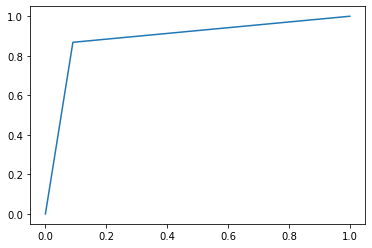

In [679]:
evaluate_model_1(y_test, xgb_fn_2.predict(X_test))

In [680]:
y_test.head()

15448    0
29236    0
33187    0
44667    0
67246    0
Name: churn_probability, dtype: int64

In [683]:
xgb_fn_2.predict_proba(X_test.head())

array([[0.9624514 , 0.03754861],
       [0.9797683 , 0.02023175],
       [0.9809871 , 0.01901295],
       [0.9671901 , 0.03280993],
       [0.11584657, 0.8841534 ]], dtype=float32)

In [688]:
def get_custom_roc(actual, probs):
    probs = probs.T[1]
    fpr, tpr, tresh = metrics.roc_curve(actual, probs)
    auc = metrics.roc_auc_score(actual, probs)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = tresh[optimal_idx]
    print(f'optimal threshold-- {optimal_threshold}') 
    pyplot.plot(fpr,tpr,label="auc="+str(auc), )
    pyplot.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='black', label='Best')
    pyplot.xlabel('False Positive Rate')
    pyplot.ylabel('True Positive Rate')
    pyplot.legend(loc=4)

optimal threshold-- 0.5446254014968872


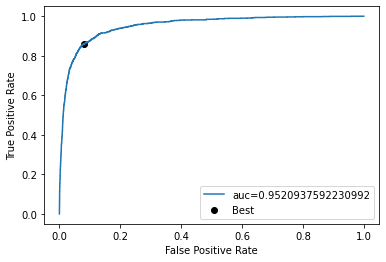

In [689]:
get_custom_roc(y_test, xgb_fn_2.predict_proba(X_test))

In [693]:
pr = xgb_fn_2.predict_proba(X_test.head()).T[1]; pr

array([0.03754861, 0.02023175, 0.01901295, 0.03280993, 0.8841534 ],
      dtype=float32)

In [694]:
thresh = 0.5446254014968872

In [696]:
[1 if x>thresh else 0 for x in pr]

[0, 0, 0, 0, 1]

In [700]:
def make_submissions_from_probs(probs, thresh, name):
    probs = probs.T[1]
    preds = [1 if x>thresh else 0 for x in probs]
    tmp_sub = pd.DataFrame()
    tmp_sub['id'] = test_ids
    tmp_sub['churn_probability'] = preds
    tmp_sub.to_csv(f'./submissions/{name}', index = False)

In [713]:
make_submissions_from_probs(clf2.predict_proba(test_df), 0.4, 'lr_custom_thresh4.csv')

In [711]:
clf2.predict_proba(X_test.head()).T[1]

array([0.00239956, 0.08334405, 0.00266114, 0.00505703, 0.32998942])

In [715]:
base_xgb_best = XGBClassifier(n_jobs = 4,max_depth = 3, min_child_weight = 0.1, subsample = 0.8)

In [716]:
base_xgb_grid_best = {'learning_rate': [0.01, 0.05, 0.1, 0.3],
                  'n_estimators' : [100, 250, 500]}

In [717]:
base_xgb_5_best = GridSearchCV(estimator = base_xgb_best,
                              param_grid = base_xgb_grid_best,
                               scoring = 'f1',
                               cv = 3,
                                verbose=4,
                                n_jobs= 4, return_train_score=True )

In [718]:
base_xgb_5_best.fit(X_train, y_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV 1/3] END learning_rate=0.01, n_estimators=250;, score=(train=0.679, test=0.680) total time= 3.0min
[CV 2/3] END learning_rate=0.01, n_estimators=500;, score=(train=0.678, test=0.689) total time= 5.8min
[CV 3/3] END learning_rate=0.05, n_estimators=250;, score=(train=0.715, test=0.679) total time= 3.5min
[CV 1/3] END learning_rate=0.1, n_estimators=100;, score=(train=0.705, test=0.692) total time= 1.3min
[CV 2/3] END learning_rate=0.1, n_estimators=100;, score=(train=0.700, test=0.697) total time= 1.4min
[CV 3/3] END learning_rate=0.1, n_estimators=100;, score=(train=0.708, test=0.675) total time= 1.3min
[CV 1/3] END learning_rate=0.1, n_estimators=250;, score=(train=0.740, test=0.693) total time= 3.4min
[CV 2/3] END learning_rate=0.1, n_estimators=500;, score=(train=0.786, test=0.699) total time= 7.5min
[CV 3/3] END learning_rate=0.3, n_estimators=250;, score=(train=0.825, test=0.672) total time= 3.6min


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_ca...
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=0.1,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=4,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=4,
             param_grid={'learning_rate': [0.01, 0.05, 0.1, 0.3],
                         'n_estimators': [100, 250, 500]},
             return_train_score=True, scoring='f1', verbose=4)

[CV 3/3] END learning_rate=0.01, n_estimators=100;, score=(train=0.686, test=0.663) total time= 1.3min
[CV 2/3] END learning_rate=0.01, n_estimators=250;, score=(train=0.673, test=0.689) total time= 2.8min
[CV 3/3] END learning_rate=0.01, n_estimators=500;, score=(train=0.689, test=0.667) total time= 5.9min
[CV 1/3] END learning_rate=0.05, n_estimators=500;, score=(train=0.738, test=0.697) total time= 6.9min
[CV 2/3] END learning_rate=0.1, n_estimators=250;, score=(train=0.732, test=0.700) total time= 3.3min
[CV 3/3] END learning_rate=0.1, n_estimators=500;, score=(train=0.789, test=0.685) total time= 7.6min
[CV 1/3] END learning_rate=0.3, n_estimators=500;, score=(train=0.925, test=0.670) total time= 6.2min


In [719]:
base_xgb_5_best.best_params_

{'learning_rate': 0.1, 'n_estimators': 500}

[CV 2/3] END learning_rate=0.01, n_estimators=100;, score=(train=0.672, test=0.687) total time= 1.3min
[CV 3/3] END learning_rate=0.01, n_estimators=250;, score=(train=0.685, test=0.665) total time= 2.8min
[CV 1/3] END learning_rate=0.05, n_estimators=100;, score=(train=0.684, test=0.684) total time= 1.2min
[CV 2/3] END learning_rate=0.05, n_estimators=100;, score=(train=0.678, test=0.690) total time= 1.2min
[CV 3/3] END learning_rate=0.05, n_estimators=100;, score=(train=0.688, test=0.667) total time= 1.2min
[CV 2/3] END learning_rate=0.05, n_estimators=250;, score=(train=0.708, test=0.697) total time= 3.4min
[CV 3/3] END learning_rate=0.05, n_estimators=500;, score=(train=0.742, test=0.681) total time= 6.6min
[CV 1/3] END learning_rate=0.1, n_estimators=500;, score=(train=0.790, test=0.699) total time= 6.9min
[CV 1/3] END learning_rate=0.3, n_estimators=250;, score=(train=0.829, test=0.688) total time= 4.2min
[CV 2/3] END learning_rate=0.3, n_estimators=500;, score=(train=0.922, test

In [720]:
get_metrics(base_xgb_5_best.predict(X_train), base_xgb_5_best.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.8481352464184834
auc_roc (test) -- 0.8182060936980983
f1 (train) -- 0.7610074626865672
f1 (test) -- 0.7050898203592815


### Best model with highest AUC_ROC  - xgboost

In [753]:
get_metrics(xgb_fn_2.predict(X_train), xgb_fn_2.predict(X_test),y_train, y_test )

auc_roc (train) -- 0.9143458728974044
auc_roc (test) -- 0.8889485326809189
f1 (train) -- 0.6793383068439831
f1 (test) -- 0.6517504606475388


 overall accuracy-- 0.9055
 overall f1-- 0.6517504606475388
----------------classification report----------------
              precision    recall  f1-score   support

           0       0.98      0.91      0.95     12574
           1       0.52      0.87      0.65      1426

    accuracy                           0.91     14000
   macro avg       0.75      0.89      0.80     14000
weighted avg       0.94      0.91      0.92     14000

----------------confussion matrix----------------
[[11439  1135]
 [  188  1238]]
sensitivity -- 0.8681626928471248
specificity -- 0.9097343725147129
----------------roc curve----------------
 auc_roc-- 0.8889485326809189


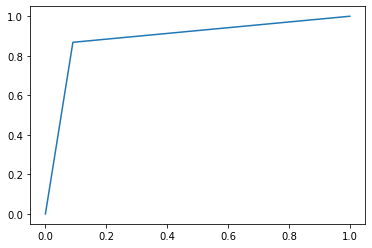

In [754]:
evaluate_model(y_test, xgb_fn_2.predict(X_test))

optimal threshold-- 0.5446254014968872


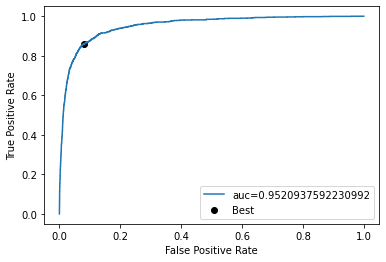

In [755]:
get_custom_roc(y_test, xgb_fn_2.predict_proba(X_test))

In [756]:
metrics.accuracy_score(y_test, xgb_fn_2.predict(X_test))

0.9055

In [763]:
make_submissions(xgb_fn_2.predict(test_df), 'submissions.csv')

### End.